# 1. Introducción y Metodología del Proyecto

En este proyecto analizo el dataset Cora, el cual consta de 2708 publicaciones científicas y 5429 relaciones de citación. Mi objetivo es explorar y evaluar distintos enfoques de deep learning para clasificar los artículos científicos. Para ello, sigo estos pasos:

- **Carga y Preprocesamiento:** Extracción de la información del archivo `cora.content` (características y etiquetas) y del archivo `cora.cites` (estructura del grafo de citaciones).

- **Análisis Exploratorio y Visualización:** Visualizaciones para comprender la distribución tanto del contenido de los artículos como de las relaciones entre ellos.

- **Generación de Modelos:** Implementación de modelos basados en Redes Neuronales de Grafos (GNN), comenzando con una Graph Convolutional Network (GCN) y explorando otras arquitecturas como Graph Attention Network (GAT) y GraphSAGE.

- **Evaluación de Modelos:** Comparación del desempeño de los modelos GNN con el de un modelo de red neuronal tradicional (MLP) para determinar si incorporar la estructura del grafo mejora la clasificación.

Durante el proceso, también he intentado usar GNN en TensorFlow mediante bibliotecas como Spektral y DGL; sin embargo, se presentaron problemas de compatibilidad, por lo que he optado por desarrollar un MLP secuencial como línea base.

La expresión "línea base" se refiere a un modelo de referencia simple que utilizo para comparar el desempeño de modelos más complejos. En este caso, el MLP secuencial, que no incorpora la estructura del grafo, actúa como línea base. Esto me permite evaluar si el uso de GNN (que aprovechan las relaciones entre los nodos) mejora realmente la clasificación en comparación con un modelo más tradicional, entendiendo "línea base" como un modelo de referencia simple que utilizo para comparar el desempeño de modelos más complejos, como el uso de GNN previamente comentado.


# 2. ¿Qué son las Redes Neuronales de Grafos (GNN)?

Las Redes Neuronales de Grafos (GNN) son modelos de deep learning diseñados para trabajar con datos organizados en grafos. A diferencia de las redes tradicionales, que procesan datos de forma independiente, las GNN integran la información de los nodos y sus conexiones. Esto nos permite aprender representaciones que capturan tanto las características individuales como la estructura global del grafo, facilitándonos la detección de patrones complejos en conjuntos de datos interconectados.

# 3. Modelos de GNN Utilizados en el Proyecto

En este trabajo he explorado diversas arquitecturas de GNN para la clasificación de artículos en el dataset Cora:

- **GCN (Graph Convolutional Network):** Es mi modelo principal, ya que aplica operaciones de convolución adaptadas a la estructura del grafo, combinando la información textual de cada artículo con sus relaciones de citación.

- **GAT (Graph Attention Network) y GraphSAGE:** He probado también modelos como GAT, que utiliza mecanismos de atención para ponderar la influencia de cada vecino, y GraphSAGE, que emplea técnicas de muestreo y agregación de vecinos.

- **Implementaciones en TensorFlow:** Intenté usar Spektral y DGL para implementar GNN en TensorFlow, pero se presentaron problemas de compatibilidad. Por ello, he comparado estos enfoques con un modelo MLP tradicional, lo que me permite valorar si la estructura del grafo realmente aporta mejoras en la clasificación.

# 4. Datos Disponibles en el Dataset Cora

El dataset Cora me proporciona dos fuentes complementarias de información:

- **cora.content:** Cada artículo se representa mediante un identificador único, un vector binario de 1433 dimensiones (que indica la presencia o ausencia de palabras en un diccionario) y una etiqueta que clasifica el artículo en una de siete categorías.

- **cora.cites:** Este archivo contiene las relaciones de citación entre los artículos, formando un grafo dirigido. Cada arista indica que un artículo cita a otro, lo que define la estructura de interconexión entre los nodos.

La combinación de la información textual de los artículos con la estructura de citaciones me permite diseñar modelos que integren ambos tipos de datos, aprovechando al máximo el potencial de las redes neuronales de grafos para mejorar la clasificación.


---

## Carga y Procesamiento del Dataset Cora (`cora.content` y `cora.cites`)

### Cargamos `cora.content`

In [2]:
import pandas as pd # Librería para manipulación de datos
import numpy as np # Librería para operaciones numéricas
import matplotlib.pyplot as plt # Para gráficos
import seaborn as sns           # Para visualizaciones más bonitas
import networkx as nx           # Para trabajar con grafos
import random                   # Para seleccionar nodos aleatorios en el grafo


# NetworkX
# --------
# Librería para trabajar con grafos
# NetworkX permite crear, manipular y analizar grafos de manera sencilla.
# Es ideal para representar redes de citaciones y explorar sus propiedades.
import networkx as nx  

from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings("ignore")


Resultado: `data` es un DataFrame donde:

- La **primera columna** contiene el identificador de cada artículo (`paper_id`).

- Las **siguientes 1433 columnas** contienen valores binarios (`0` o `1`), indicando la presencia de palabras en el artículo (Bag-of-Words).

- La **última columna** contiene la categoría del artículo.

---

In [3]:
# Cargar el archivo cora.content
archivo_content = "data/cora.content"

# Leer el archivo (espacios como separador)
data = pd.read_csv(archivo_content, sep="\t", header=None) # header=None → Indica que no hay una fila de encabezado, por lo que las columnas se numeran automáticamente.

print(data.size)
print(data.shape)

3885980
(2708, 1435)


In [4]:
# Mostrar información básica del DataFrame
print("Información general del DataFrame (cora.content):")
print(f"Total de elementos (data.size): {data.size}")
print(f"Dimensiones (data.shape): {data.shape}\n")

# Visualizar las primeras filas del DataFrame
print("Primeras 5 filas del dataset:")
print(data.head(), "\n")

Información general del DataFrame (cora.content):
Total de elementos (data.size): 3885980
Dimensiones (data.shape): (2708, 1435)

Primeras 5 filas del dataset:
      0     1     2     3     4     5     6     7     8     9     ...  1425  \
0    31336     0     0     0     0     0     0     0     0     0  ...     0   
1  1061127     0     0     0     0     0     0     0     0     0  ...     0   
2  1106406     0     0     0     0     0     0     0     0     0  ...     0   
3    13195     0     0     0     0     0     0     0     0     0  ...     0   
4    37879     0     0     0     0     0     0     0     0     0  ...     0   

   1426  1427  1428  1429  1430  1431  1432  1433                    1434  
0     0     1     0     0     0     0     0     0         Neural_Networks  
1     1     0     0     0     0     0     0     0           Rule_Learning  
2     0     0     0     0     0     0     0     0  Reinforcement_Learning  
3     0     0     0     0     0     0     0     0  Reinforcem

In [5]:
data.head()

,0,1,2,3,4,5,6,7,8,9,...,1425,1426,1427,1428,1429,1430,1431,1432,1433,1434
0,31336,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,Neural_Networks
1,1061127,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,Rule_Learning
2,1106406,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Reinforcement_Learning
3,13195,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Reinforcement_Learning
4,37879,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Probabilistic_Methods


#### **Extraer datos relevantes**

##### **IDs de los artículos**

- Extraemos **la primera columna** del DataFrame (`iloc[:, 0]`).

- Resultado: Un array con los IDs únicos de los artículos.


In [6]:
 # IDs de los artículos
paper_ids = data.iloc[:, 0].values
paper_ids

array([  31336, 1061127, 1106406, ..., 1128978,  117328,   24043])

##### **Matriz de características (Bag-of-Words)**

- Extraemos todas las columnas excepto la primera y la última (iloc[:, 1:-1]).

- Resultado: Una matriz (2708, 1433) donde cada fila representa un artículo y cada columna una palabra del diccionario.

In [7]:
features = data.iloc[:, 1:-1].values
features

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

##### **Etiquetas de los artículos**

- Extraemos la última columna (`iloc[:, -1]`), que contiene las categorías de los artículos.

- Resultado: Un array con los valores de clasificación (7 clases posibles).

In [8]:
labels = data.iloc[:, -1].values
labels

array(['Neural_Networks', 'Rule_Learning', 'Reinforcement_Learning', ...,
       'Genetic_Algorithms', 'Case_Based', 'Neural_Networks'],
      dtype=object)

##### **Mostramos información sobre los datos**

- `len(paper_ids)` → Número total de artículos en el dataset.

- `features.shape` → Dimensión de la matriz de características (2708 artículos x 1433 características).

- `np.unique(labels)` → Muestra las clases únicas en el dataset (7 categorías distintas).

In [9]:
print(f"Total de artículos: {len(paper_ids)}")
print(f"Dimensión de la matriz de características: {features.shape}")
print(f"Clases únicas: {np.unique(labels)}")


Total de artículos: 2708
Dimensión de la matriz de características: (2708, 1433)
Clases únicas: ['Case_Based' 'Genetic_Algorithms' 'Neural_Networks'
 'Probabilistic_Methods' 'Reinforcement_Learning' 'Rule_Learning' 'Theory']


### **Visualización de datos**

#### **Distribución de Artículos por Categoría** _ _Grafico de Barras_

Utilizamos un gráfico de barras para ver cómo se distribuyen las diferentes categorías de artículos.

- Este gráfico muestra cuántos artículos hay de cada categoría, permitiéndonos identificar rápidamente las clases más y menos representadas.

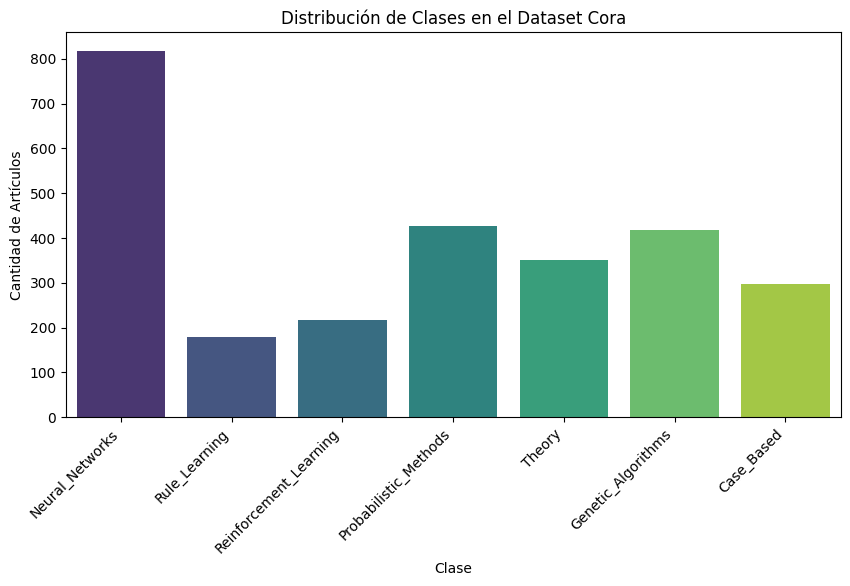

In [10]:
# Visualizar la distribución de clases
plt.figure(figsize=(10, 5))
sns.countplot(x=labels, palette="viridis")
plt.title("Distribución de Clases en el Dataset Cora")
plt.xlabel("Clase")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Cantidad de Artículos")
plt.show()

#### **Distribución del Número de Palabras Activadas por Artículo** _ _Histograma_

Dado que cada artículo se representa mediante un vector binario (bag-of-words), podemos sumar los valores de cada fila para obtener el número de palabras presentes en cada artículo y visualizarlo con un histograma.

- Con este histograma podemos ver si la mayoría de los artículos tienen pocos o muchas palabras activadas, lo que nos da una idea sobre la densidad del bag-of-words.

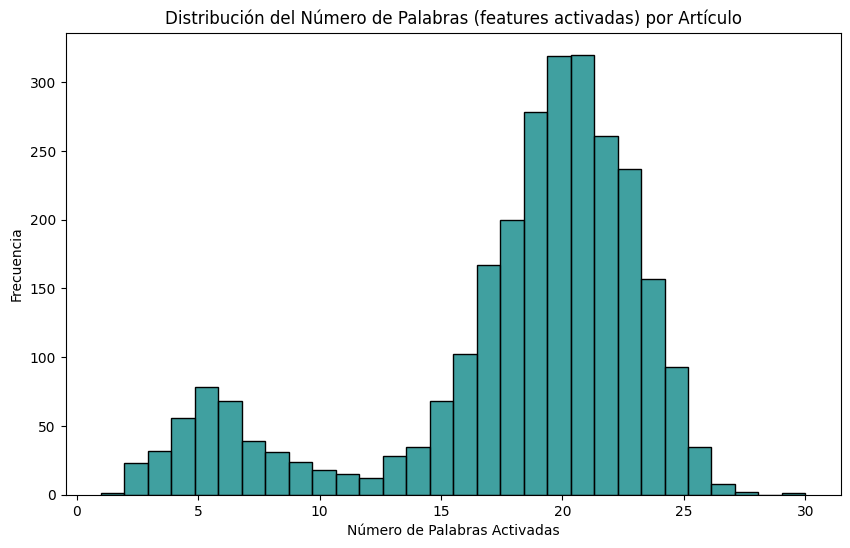

In [11]:
# Extraer la matriz de características (desde la columna 1 hasta la penúltima)
features_df = data.iloc[:, 1:-1]

# Sumar los valores por fila para obtener el "conteo" de palabras activadas
features_sum = features_df.sum(axis=1)

plt.figure(figsize=(10, 6))
sns.histplot(features_sum, bins=30, color="teal")
plt.title("Distribución del Número de Palabras (features activadas) por Artículo")
plt.xlabel("Número de Palabras Activadas")
plt.ylabel("Frecuencia")
plt.show()


#### **Visualización de los Artículos en 2D usando PCA** _ _Scatter Plot (Diagrama de Dispersión)_

La reducción de dimensionalidad con PCA permite proyectar los 1433 features a 2 componentes principales y visualizar cómo se agrupan los artículos según su categoría.

- Este scatter plot nos permite ver cómo se agrupan los artículos en función de sus features, lo cual puede darnos pistas sobre la separabilidad de las clases y la posible efectividad de un modelo de clasificación.

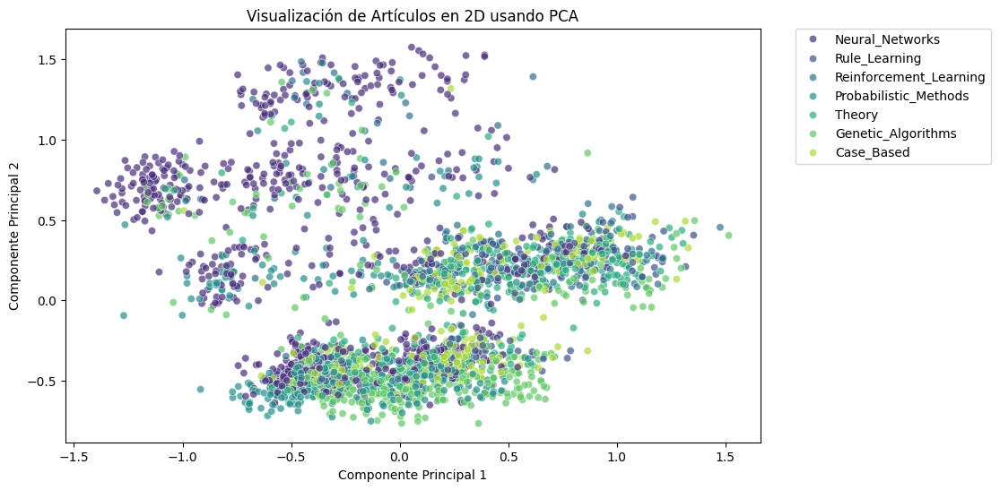

In [12]:
from sklearn.decomposition import PCA
import pandas as pd

# Reducir a 2 componentes usando PCA
pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_df)

# Crear un DataFrame con los resultados de PCA y las etiquetas
pca_df = pd.DataFrame(data=features_pca, columns=['PC1', 'PC2'])
# pca_df['Categoría'] = labels.values # Me da error, pero ayer funcionaba, wtf
pca_df['Categoría'] = labels


plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Categoría', palette="viridis", alpha=0.7)
plt.title("Visualización de Artículos en 2D usando PCA")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()


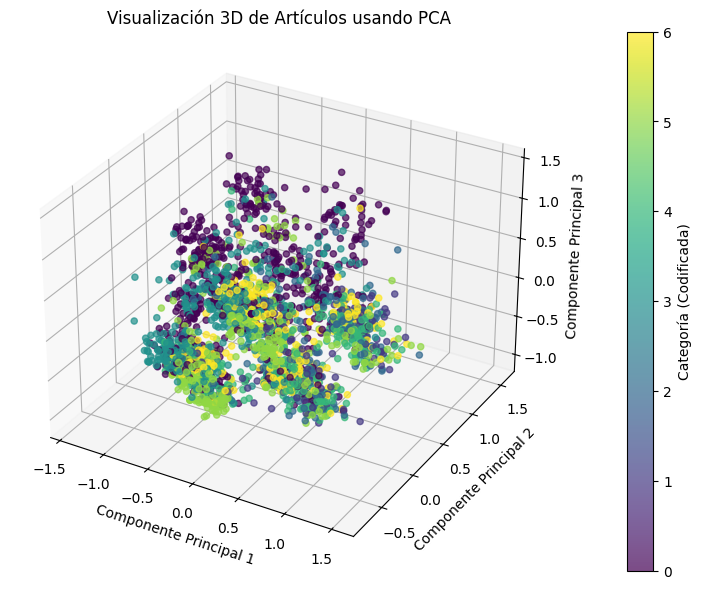

In [13]:
from sklearn.decomposition import PCA
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

# Reducir a 3 componentes usando PCA
pca = PCA(n_components=3)
features_pca = pca.fit_transform(features_df)

# Convertir categorías en valores numéricos
label_codes, label_names = pd.factorize(labels)  # Convierte a números

# Crear un DataFrame con los resultados de PCA y las etiquetas
pca_df = pd.DataFrame(data=features_pca, columns=['PC1', 'PC2', 'PC3'])
pca_df['Categoría'] = label_codes  # Usamos los valores numéricos

# Configurar el gráfico 3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Dibujar el scatter plot 3D
scatter = ax.scatter(pca_df['PC1'], pca_df['PC2'], pca_df['PC3'], 
                     c=pca_df['Categoría'], cmap='viridis', alpha=0.7)

# Etiquetas y título
ax.set_title("Visualización 3D de Artículos usando PCA")
ax.set_xlabel("Componente Principal 1")
ax.set_ylabel("Componente Principal 2")
ax.set_zlabel("Componente Principal 3")

# Agregar leyenda con nombres originales
legend1 = plt.colorbar(scatter, ax=ax, pad=0.1)
legend1.set_label("Categoría (Codificada)")

# Mostrar el gráfico
plt.show()


In [14]:
import pandas as pd
import plotly.express as px
from sklearn.decomposition import PCA

# Reducir a 3 componentes usando PCA
pca = PCA(n_components=3)
features_pca = pca.fit_transform(features_df)

# Convertir categorías en valores numéricos
label_codes, label_names = pd.factorize(labels)  # Convierte las categorías a números

# Crear un DataFrame con los resultados de PCA y las etiquetas
pca_df = pd.DataFrame(data=features_pca, columns=['PC1', 'PC2', 'PC3'])
pca_df['Categoría'] = labels  # Mantener los nombres originales

# Crear gráfico interactivo 3D con Plotly
fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3', 
    color='Categoría',  # Colorear por categoría original
    title="Visualización 3D de Artículos usando PCA",
    labels={'PC1': 'Componente Principal 1', 'PC2': 'Componente Principal 2', 'PC3': 'Componente Principal 3'},
    opacity=0.3
)

# Ajustar vista 3D para permitir zoom y rotación sin restricciones
fig.update_layout(
    scene=dict(
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)),  # Ajustar la vista inicial
        xaxis_title="Componente Principal 1",
        yaxis_title="Componente Principal 2",
        zaxis_title="Componente Principal 3"
    ),
    margin=dict(l=0, r=0, b=0, t=40),  # Reducir los márgenes para mejor visualización
    scene_dragmode='turntable'  # Permite mejor rotación y zoom con el mouse
)

# Mostrar el gráfico interactivo
fig.show()


In [15]:
import pandas as pd
import plotly.express as px
from sklearn.decomposition import PCA

# Reducir a 3 componentes usando PCA
pca = PCA(n_components=3)
features_pca = pca.fit_transform(features_df)

# Convertir categorías en valores numéricos
label_codes, label_names = pd.factorize(labels)  # Convierte las categorías a números

# Crear un DataFrame con los resultados de PCA y las etiquetas
pca_df = pd.DataFrame(data=features_pca, columns=['PC1', 'PC2', 'PC3'])
pca_df['Categoría'] = labels  # Mantener los nombres originales

# Crear gráfico interactivo 3D con Plotly
fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3', 
    color='Categoría',  # Colorear por categoría original
    title="Visualización 3D de Artículos usando PCA",
    labels={'PC1': 'Componente Principal 1', 'PC2': 'Componente Principal 2', 'PC3': 'Componente Principal 3'},
    opacity=0.8
)

# Ajustar vista 3D para permitir zoom, rotación y aumentar el tamaño
fig.update_layout(
    scene=dict(
        camera=dict(eye=dict(x=1, y=1.5, z=1.5)),  # Ajustar la vista inicial
        xaxis_title="Componente Principal 1",
        yaxis_title="Componente Principal 2",
        zaxis_title="Componente Principal 3"
    ),
    width=1200,  # Ancho más grande
    height=800,  # Altura más grande
    margin=dict(l=0, r=0, b=0, t=50),  # Reducir los márgenes
    scene_dragmode='orbit'  # Permitir mejor rotación y zoom
)

# Mostrar el gráfico interactivo
fig.show()


#### **Visualización con t-SNE** _ _Scatter Plot (Diagrama de Dispersión)_

El t-SNE es una técnica de reducción de dimensionalidad no lineal que permite proyectar los datos en 2D para observar cómo se agrupan según sus características. Esto nos ayuda a ver la estructura interna y la separación (o solapamiento) entre las distintas categorías.

- Este gráfico muestra cómo se agrupan los artículos en un espacio bidimensional según sus características, resaltando la distribución de las diferentes categorías.

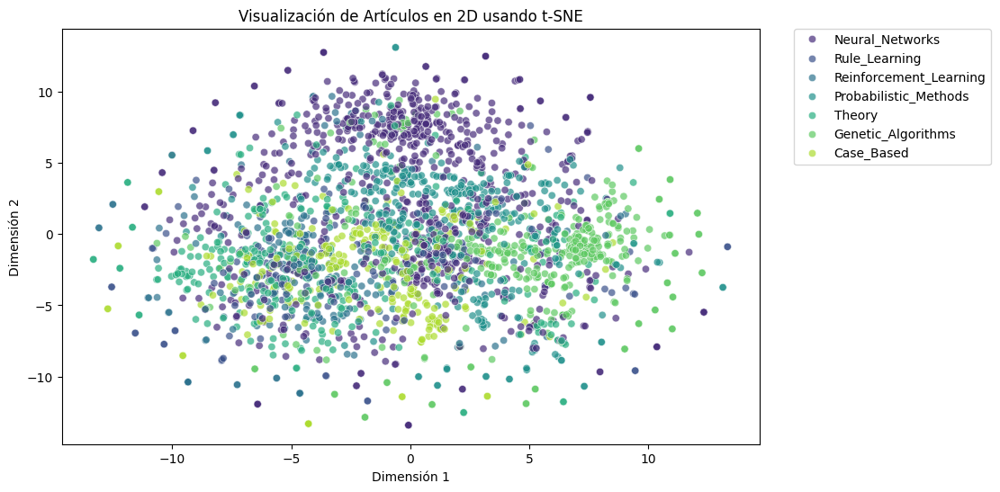

In [16]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Aplicar t-SNE a la matriz de características
tsne = TSNE(n_components=2, random_state=42)
features_tsne = tsne.fit_transform(features_df)

# Crear un DataFrame con las coordenadas resultantes y las etiquetas
tsne_df = pd.DataFrame(features_tsne, columns=['Dim1', 'Dim2'])
# pca_df['Categoría'] = labels.values
tsne_df['Categoría'] = labels

plt.figure(figsize=(10, 6))
sns.scatterplot(data=tsne_df, x='Dim1', y='Dim2', hue='Categoría', palette="viridis", alpha=0.7)
plt.title("Visualización de Artículos en 2D usando t-SNE")
plt.xlabel("Dimensión 1")
plt.ylabel("Dimensión 2")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()


In [17]:
from sklearn.manifold import TSNE
import pandas as pd
import plotly.express as px

# Aplicar t-SNE con 3 componentes
tsne = TSNE(n_components=3, random_state=42, perplexity=30)
features_tsne = tsne.fit_transform(features_df)

# Crear un DataFrame con las coordenadas resultantes y las etiquetas
tsne_df = pd.DataFrame(features_tsne, columns=['Dim1', 'Dim2', 'Dim3'])
tsne_df['Categoría'] = labels  # Mantener los nombres originales

# Crear gráfico interactivo 3D con Plotly
fig = px.scatter_3d(
    tsne_df, x='Dim1', y='Dim2', z='Dim3', 
    color='Categoría',  # Colorear por categoría original
    title="Visualización 3D de Artículos usando t-SNE",
    labels={'Dim1': 'Dimensión 1', 'Dim2': 'Dimensión 2', 'Dim3': 'Dimensión 3'},
    opacity=0.8
)

# Ajustar vista 3D para mejor interacción
fig.update_layout(
    scene=dict(
        camera=dict(eye=dict(x=1, y=1, z=1)),  # Ajustar la vista inicial
        xaxis_title="Dimensión 1",
        yaxis_title="Dimensión 2",
        zaxis_title="Dimensión 3"
    ),
    width=1200,  # Ancho más grande
    height=800,  # Altura más grande
    margin=dict(l=0, r=0, b=0, t=50),  # Reducir los márgenes
    scene_dragmode='orbit'  # Mejor control de zoom y rotación
)

# Mostrar el gráfico interactivo
fig.show()


#### **Correlación de un Subconjunto de Features** _ _Heatmap (Mapa de Calor)_

Dado que la matriz de features es muy grande, podemos visualizar la correlación de un subconjunto (por ejemplo, las primeras 300 columnas) para entender relaciones entre algunas palabras.

- Este heatmap nos muestra la correlación entre algunas de las features seleccionadas, lo que nos puede ayudar a identificar si existen grupos de palabras que tienden a activarse juntas.

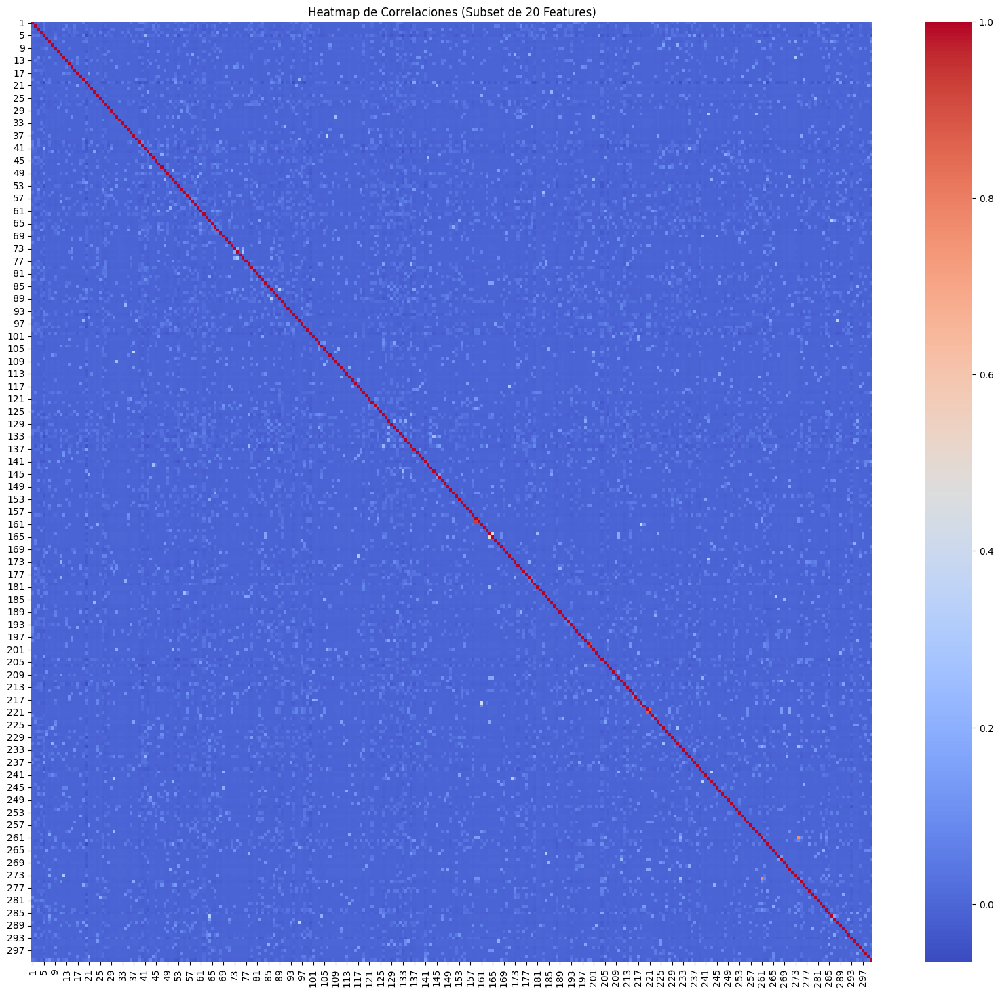

In [18]:
plt.figure(figsize=(20, 18))
subset_features = features_df.iloc[:, :300]  # Seleccionamos 300 features arbitrarias
sns.heatmap(subset_features.corr(), annot=False, fmt=".2f", cmap="coolwarm")
plt.title("Heatmap de Correlaciones (Subset de 20 Features)")
plt.show()

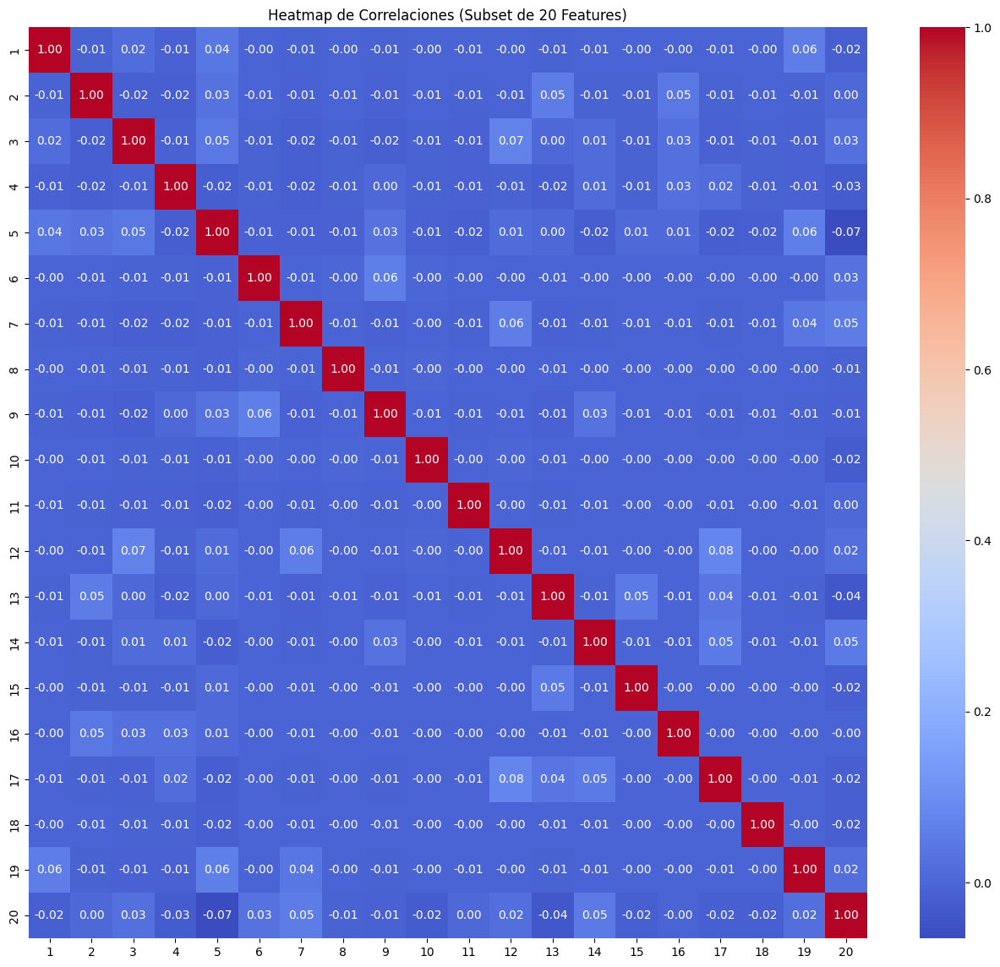

In [19]:
plt.figure(figsize=(16, 14))
subset_features = features_df.iloc[:, :20]  # Seleccionamos 300 features arbitrarias
sns.heatmap(subset_features.corr(), annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Heatmap de Correlaciones (Subset de 20 Features)")
plt.show()

#### **Distribución de Número Palabras Activadas por Categoría** _ _Boxplot (Gráfico de Cajas)_

Suma de los valores binarios por artículo para cada categoría. Esto nos permite ver si algunas categorías tienden a tener documentos más "densos" en términos de contenido.

- Este gráfico muestra cómo se agrupan los artículos en un espacio bidimensional según sus características, resaltando la distribución de las diferentes categorías.

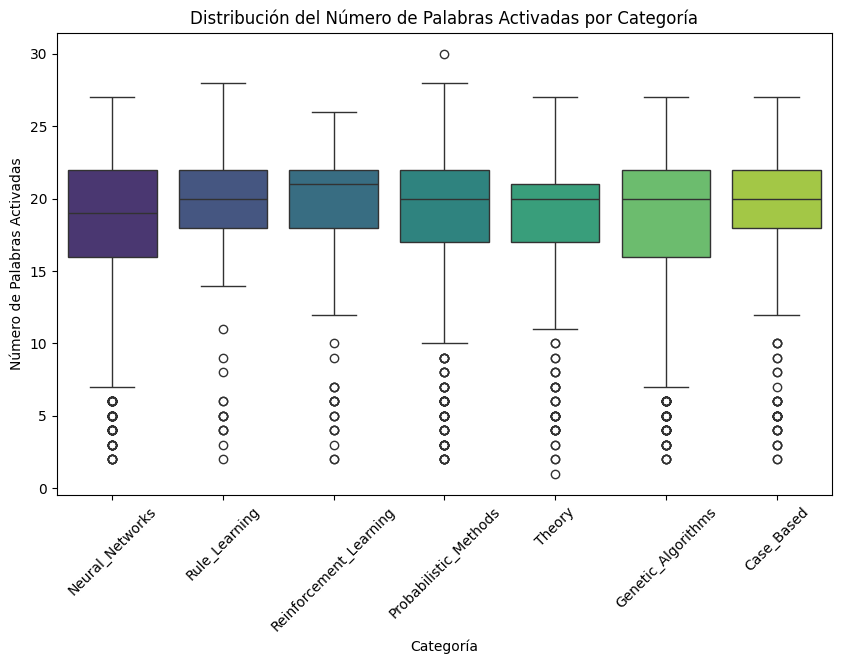

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Sumar los valores de cada fila para obtener el número de palabras activadas
features_sum = features_df.sum(axis=1)

# Crear un DataFrame con la suma de palabras y las etiquetas
df_box = pd.DataFrame({'Palabras_activadas': features_sum, 'Categoría': labels})

plt.figure(figsize=(10, 6))
sns.boxplot(x='Categoría', y='Palabras_activadas', data=df_box, palette="viridis")
plt.title("Distribución del Número de Palabras Activadas por Categoría")
plt.xlabel("Categoría")
plt.ylabel("Número de Palabras Activadas")
plt.xticks(rotation=45)
plt.show()


#### **Frecuencia de las 20 Palabras (Features) Más Comunes** _ _Grafico de Barras_

Calculamos la frecuencia total de cada palabra en el dataset, seleccionamos las 20 más frecuentes y mostramos sus valores en un gráfico de barras.

- Con este gráfico podemos identificar cuáles son las features (aunque sean índices) que se repiten más a lo largo de todos los artículos.

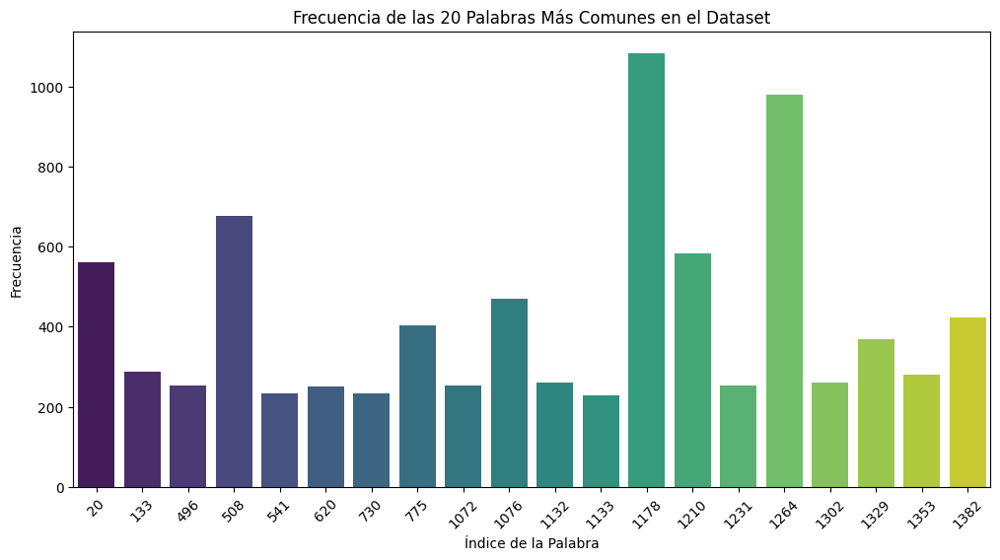

In [21]:
# Calcular la frecuencia total de cada palabra (sumando columnas)
word_freq = features_df.sum(axis=0)

# Seleccionar las 20 palabras (índices) más frecuentes en todo el dataset
top_words = word_freq.sort_values(ascending=False).head(20)

plt.figure(figsize=(12, 6))
sns.barplot(x=top_words.index, y=top_words.values, palette="viridis")
plt.title("Frecuencia de las 20 Palabras Más Comunes en el Dataset")
plt.xlabel("Índice de la Palabra")
plt.ylabel("Frecuencia")
plt.xticks(rotation=45)
plt.show()

#### **Frecuencia de las 20 Palabras Más Frecuentes por Categoríaa** _ _Heatmap (Mapa de Calor)_

Esta visualización muestra, para cada categoría, la cantidad total de veces que se activa cada una de las 20 features (palabras) más frecuentes en el dataset. Así podremos ver en qué categorías se repite más cada "palabra" (por ejemplo, la que aparece más en todo el conjunto, como sería el caso la feature con índice 1178).

- Este heatmap nos permite ver, por ejemplo, que la feature con índice 20 (la más frecuente globalmente) se repite más en la categoría "Neural_Networks" que en todas las demás categrías juntas.

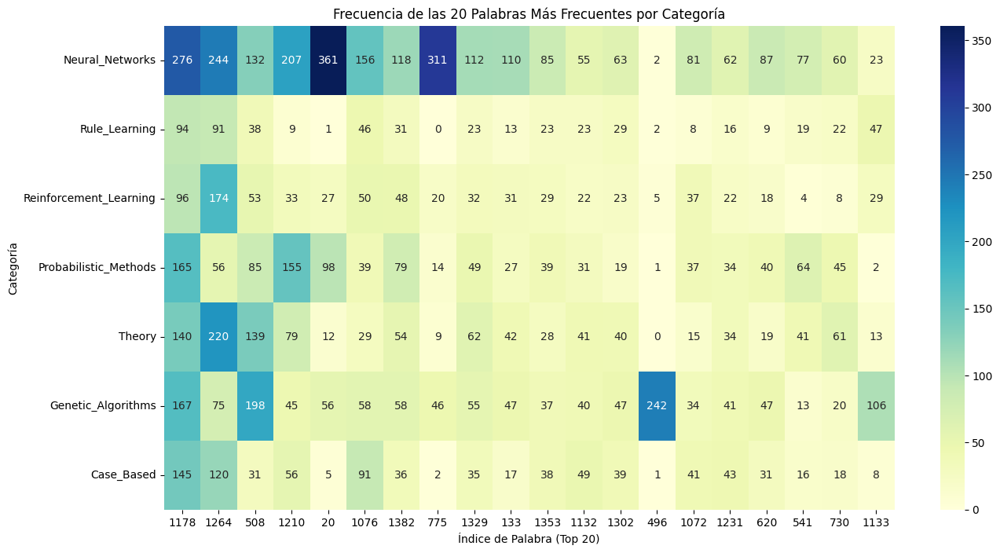

In [22]:
# Calcular la frecuencia total de cada palabra en el dataset (features)
word_freq = features_df.sum(axis=0)

# Seleccionar las 20 palabras (índices) más frecuentes en todo el dataset
top_words = word_freq.sort_values(ascending=False).head(20).index

# Crear una matriz que, para cada categoría, sume la presencia de estas 20 palabras
categorias = data.iloc[:, -1].unique()
cat_word_freq = {}

for cat in categorias:
    # Filtrar los artículos de la categoría 'cat'
    df_cat = features_df[data.iloc[:, -1] == cat]
    # Sumar las activaciones para las palabras seleccionadas
    cat_word_freq[cat] = df_cat[top_words].sum()

# Convertir el diccionario en un DataFrame y transponer para que las filas sean categorías
cat_word_freq_df = pd.DataFrame(cat_word_freq).T

# Visualizar con un heatmap
plt.figure(figsize=(15, 8))
sns.heatmap(cat_word_freq_df, annot=True, fmt="d", cmap="YlGnBu")
plt.title("Frecuencia de las 20 Palabras Más Frecuentes por Categoría")
plt.xlabel("Índice de Palabra (Top 20)")
plt.ylabel("Categoría")
plt.show()


#### **Palabra con Mayor Frequencia Global de Todo el Conjunto** _ _Gráfico de Barras_

Para profundizar en una palabra en particular (en este caso, la más frecuente en el conjunto), creamos un gráfico de barras que muestre su frecuencia en cada categoría.

- Con este gráfico podemos identificar claramente en qué categorías se repite más la feature más frecuente (o cualquier otra que elijamos explorar) y compararlo entre las distintas clases.

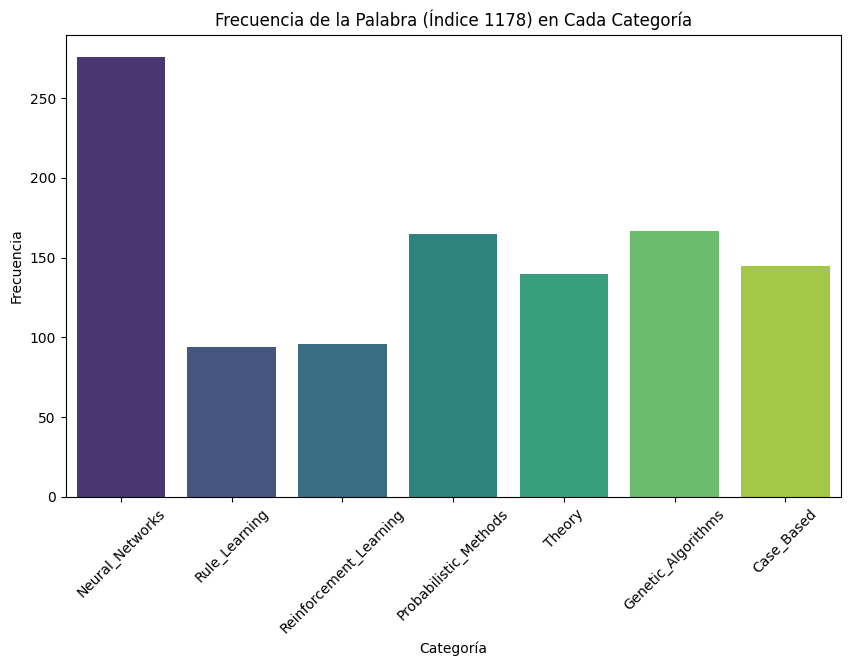

In [23]:
# Seleccionar la palabra (feature) con mayor frecuencia global
top_word = top_words[0]

plt.figure(figsize=(10, 6))
sns.barplot(x=cat_word_freq_df.index, y=cat_word_freq_df[top_word], palette="viridis")
plt.title(f"Frecuencia de la Palabra (Índice {top_word}) en Cada Categoría")
plt.xlabel("Categoría")
plt.ylabel("Frecuencia")
plt.xticks(rotation=45)
plt.show()


In [24]:
# Estadísticas descriptivas de las características (aunque sean 0/1, es útil ver el resumen)
features_df = pd.DataFrame(features)
print("Estadísticas descriptivas de las características:")
print(features_df.describe(), "\n")

Estadísticas descriptivas de las características:
              0            1            2            3            4     \
count  2708.000000  2708.000000  2708.000000  2708.000000  2708.000000   
mean      0.005908     0.012186     0.025849     0.026588     0.060931   
std       0.076653     0.109736     0.158715     0.160905     0.239247   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.000000     0.000000     0.000000     0.000000     0.000000   
50%       0.000000     0.000000     0.000000     0.000000     0.000000   
75%       0.000000     0.000000     0.000000     0.000000     0.000000   
max       1.000000     1.000000     1.000000     1.000000     1.000000   

              5            6            7            8            9     ...  \
count  2708.000000  2708.000000  2708.000000  2708.000000  2708.000000  ...   
mean      0.002585     0.010709     0.002954     0.011817     0.002216  ...   
std       0.050786     0.102948     0.054282  

---

## **Construcción del Grafo** de Citaciones en el Dataset Cora (`cora.cites`)

### En este bloque de código, construimos un **grafo dirigido** a partir del archivo `cora.cites`, el cual contiene las relaciones de citación entre los artículos científicos.

##### **¿Para qué nos sirve este grafo?**

Este grafo es esencial para entrenar **Redes Neuronales de Grafos (GNNs)**, ya que proporciona la estructura sobre la cual se propagan las características y etiquetas de los nodos, mejorando la capacidad de clasificación del modelo.

#### **Cargar el archivo `cora.cites`**

- Definimos la ruta donde se encuentra el archivo Cora.cites dentro de la carpeta data/.

In [25]:
# Cargar el archivo de citaciones
archivo_cites = "data/cora.cites"


#### **Leer las relaciones de citación**

- `sep="\t"` → Indica que los valores están separados por tabulaciones.

- `header=None` → Indica que no hay una fila de encabezado, por lo que las columnas se numeran automáticamente.

Resultado: `edges` es un DataFrame donde cada fila representa una relación de citación:

- La primera columna es el ID del artículo que cita a otro.

- La segunda columna es el ID del artículo que es citado.

In [26]:
# Leemos las relaciones de citación
edges = pd.read_csv(archivo_cites, sep="\t", header=None)

In [27]:
# Información básica
print("Información general del dataset cora.cites:")
print(f" - Número total de elementos: {edges.size}")
print(f" - Dimensiones (filas, columnas): {edges.shape}")
print("\nPrimeras 5 filas:")
print(edges.head())


Información general del dataset cora.cites:
 - Número total de elementos: 10858
 - Dimensiones (filas, columnas): (5429, 2)

Primeras 5 filas:
    0        1
0  35     1033
1  35   103482
2  35   103515
3  35  1050679
4  35  1103960


#### **Crear un grafo dirigido**

- `nx.DiGraph()` → Crea un grafo dirigido, lo que significa que las conexiones tienen una **dirección** (quién cita a quién).

- `add_edges_from()` → Añade todas las relaciones de citación como aristas del grafo.

**Resultado:**

- Cada nodo representa un **artículo científico**.

- Cada arista dirigida representa una citación entre dos artículos.

In [28]:
# Creamos un grafo dirigido
grafo = nx.DiGraph()
grafo.add_edges_from(edges.values)


#### **Mostrar información del grafo**

- `number_of_nodes()` → Devuelve el número total de artículos (nodos) en el grafo.

- `number_of_edges()` → Devuelve el número total de citaciones (aristas) en el grafo.

**Interpretación del resultado:**

- Los **nodos** representan los **2708 artículos científicos**.

- Las **aristas** representan las **5429 citaciones** entre los artículos.

In [29]:
print(f"El grafo tiene {grafo.number_of_nodes()} nodos y {grafo.number_of_edges()} aristas")

El grafo tiene 2708 nodos y 5429 aristas


---

## **Análisis de la distribución de grados en el grafo**

#### **¿Qué son los grados en un grafo?**

##### El **grado de un nodo** en un grafo es el número de conexiones (aristas) que tiene con otros nodos.

- En un **grafo dirigido**, se diferencian dos tipos de grado:

    - **In-Degree (Grado de Entrada):** Número de aristas que llegan a un nodo (cuántas veces un nodo es citado por otros).

    - **Out-Degree (Grado de Salida):** Número de aristas que salen de un nodo (cuántas veces un nodo cita a otros).

Explicación del código:

- `grafo.in_degree()` devuelve un diccionario donde las claves son los nodos y los valores son la cantidad de aristas que llegan a cada nodo (**grado de entrada**).

    - _{35: 3, 1033: 3, 103482: 1, 103515: 2, 1050679: 4, ...}_

- `grafo.out_degree()` devuelve un diccionario similar, pero contando la cantidad de aristas que salen de cada nodo (**grado de salida**).

    - _{35: 166, 1033: 2, 103482: 5, 103515: 9, 1050679: 0, ...}_


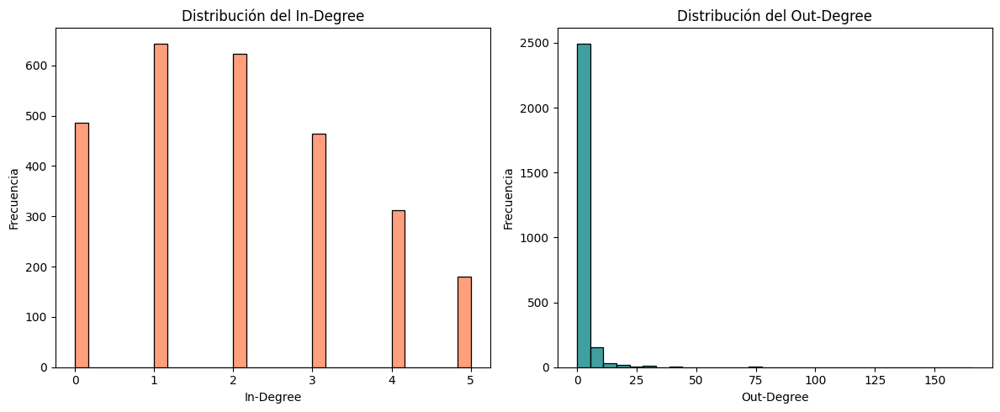

In [30]:
# Análisis de la distribución de grados en el grafo

# Cálculo de los grados de entrada y salida
in_degrees = dict(grafo.in_degree())
out_degrees = dict(grafo.out_degree())

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.histplot(list(in_degrees.values()), bins=30, color="coral")
plt.title("Distribución del In-Degree")
plt.xlabel("In-Degree")
plt.ylabel("Frecuencia")

plt.subplot(1, 2, 2)
sns.histplot(list(out_degrees.values()), bins=30, color="teal")
plt.title("Distribución del Out-Degree")
plt.xlabel("Out-Degree")
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

#### **Top 10 Artículos Más Citados (Mayor In-Degree)** _ _Gráfico de Barras_

Con esta visualización identificamos cuáles son los artículos (nodos) que tienen mayor cantidad de citas entrantes. Esto puede ayudar a detectar los trabajos más influyentes.

- Con este gráfico de barras mostramos los 10 nodos más citados en el dataset.

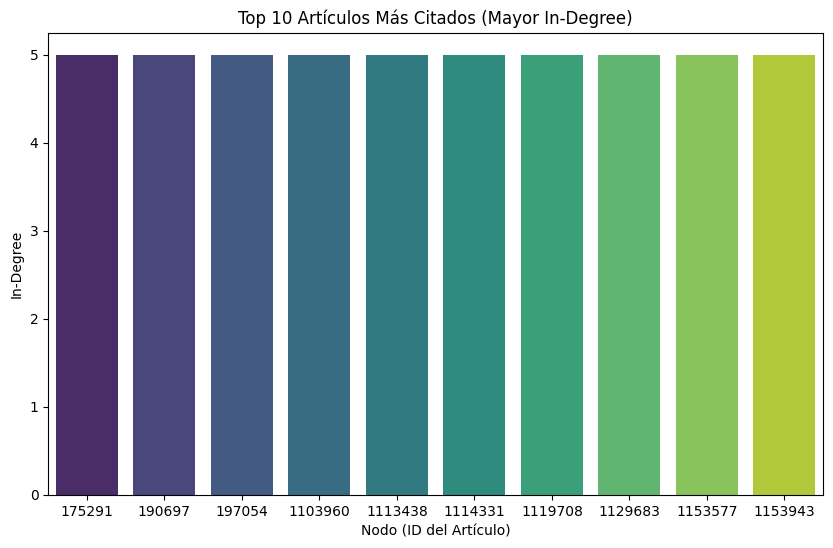

In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Obtener los 10 nodos con mayor in-degree
top_in = sorted(in_degrees.items(), key=lambda x: x[1], reverse=True)[:10]
top_in_df = pd.DataFrame(top_in, columns=["Nodo", "In-Degree"])

plt.figure(figsize=(10, 6))
sns.barplot(data=top_in_df, x="Nodo", y="In-Degree", palette="viridis")
plt.title("Top 10 Artículos Más Citados (Mayor In-Degree)")
plt.xlabel("Nodo (ID del Artículo)")
plt.ylabel("In-Degree")
plt.show()


#### **Top 10 Artículos que Han Citado a Más Artículos (Mayor Out-Degree)** _ _Gráfico de Barras_

Visualización con los 10 artículos que más citan. Representa el número de citas que realiza cada artículo (es decir, cuántos otros artículos ha citado). Los nodos están ordenado de mayor a menor. 

- Esta visualización nos permite identificar fácilmente qué artículos han citado a más otros artículos, lo que puede ser útil para detectar aquellos que actúan como difusores de información en la red de citaciones.


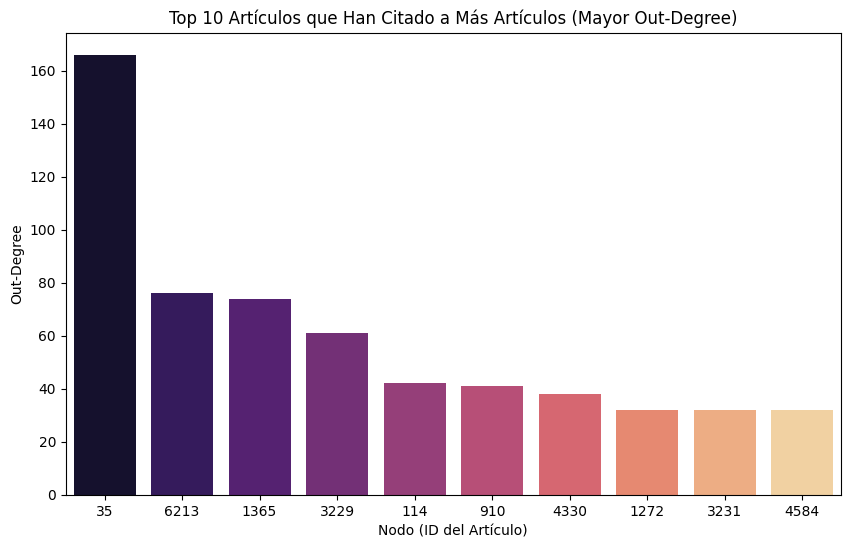

In [34]:
# Calcular el out-degree para cada nodo (número de citas realizadas por cada artículo)
# Ordenamos de mayor a menor por out-degree.
top_out = sorted(grafo.out_degree(), key=lambda x: x[1], reverse=True)[:10]

# Crear un DataFrame con los 10 nodos que tienen mayor out-degree.
top_out_df = pd.DataFrame(top_out, columns=["Nodo", "Out-Degree"])

# Para asegurar que el gráfico respete el orden, convertimos la columna "Nodo" a una variable categórica ordenada.
top_out_df["Nodo"] = pd.Categorical(top_out_df["Nodo"], categories=top_out_df["Nodo"], ordered=True)

# Graficar el Top 10 de artículos que han citado a más otros artículos.
plt.figure(figsize=(10, 6))
sns.barplot(data=top_out_df, x="Nodo", y="Out-Degree", palette="magma", order=top_out_df["Nodo"].tolist())
plt.title("Top 10 Artículos que Han Citado a Más Artículos (Mayor Out-Degree)")
plt.xlabel("Nodo (ID del Artículo)")
plt.ylabel("Out-Degree")
plt.show()

#### **Visualización de la Red de Citas con NetworkX** _ _Grafo Digido_

Usamos NetworkX y Matplotlib para visualizar la estructura de la red de citaciones presente en `cora.cites`

- Esta visualización nos permite ver cómo están conectados los artículos a través de las citaciones, resaltando la estructura y relaciones del grafo. 

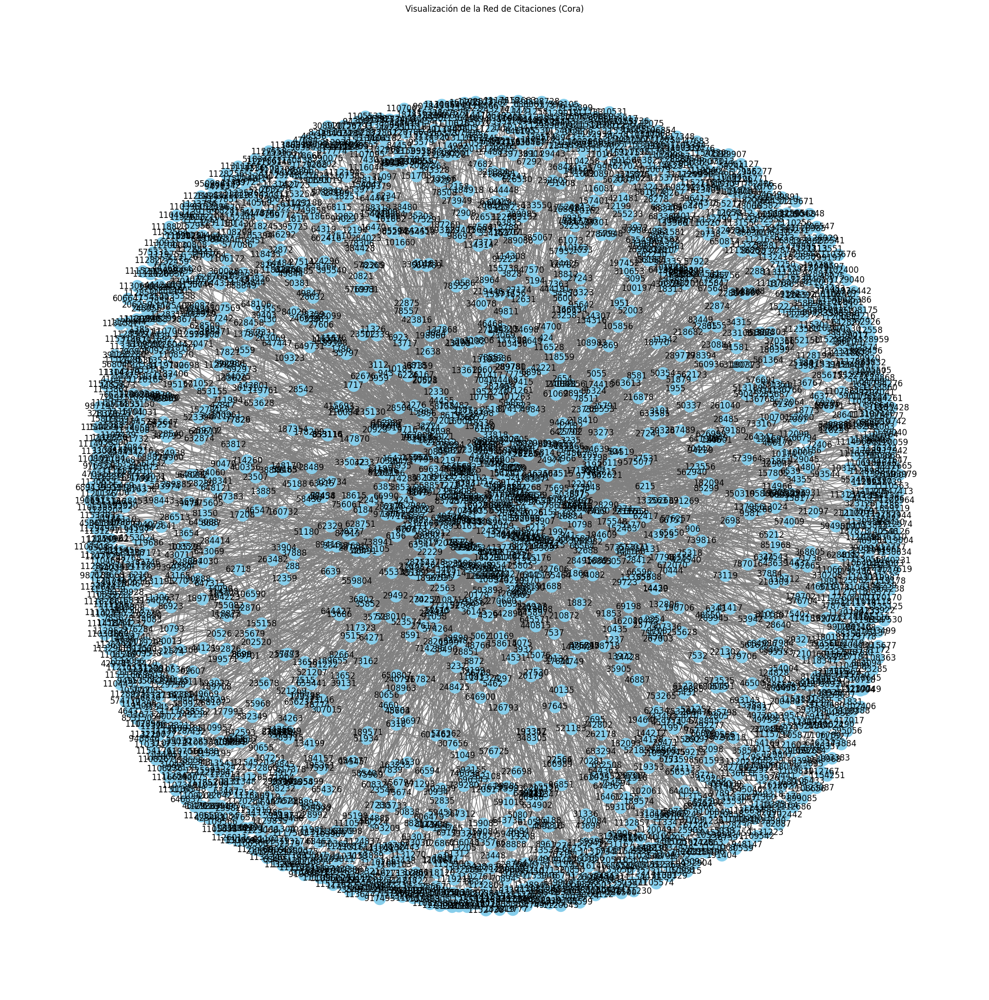

In [35]:
plt.figure(figsize=(20, 20))
# Usamos un layout de resorte para posicionar los nodos
pos = nx.spring_layout(grafo, seed=42)
nx.draw(grafo, pos, with_labels=True, node_size=300, node_color="skyblue", edge_color="gray", arrowsize=10)
plt.title("Visualización de la Red de Citaciones (Cora)")
plt.show()


#### **Visualización de un Subgrafo de Citaciones** _ _Subgrafo Dirigido_

Hemos visto que el grafo completo puede ser muy denso para visualizar, por lo que extraemos un subgrafo (en este caso, de 200 nodos aleatorios) para ver de forma gráfica la red de citaciones.

- Esta visualización nos ayuda a ver cómo están interconectados los artículos en una parte representativa del grafo, resaltando la estructura de citación.

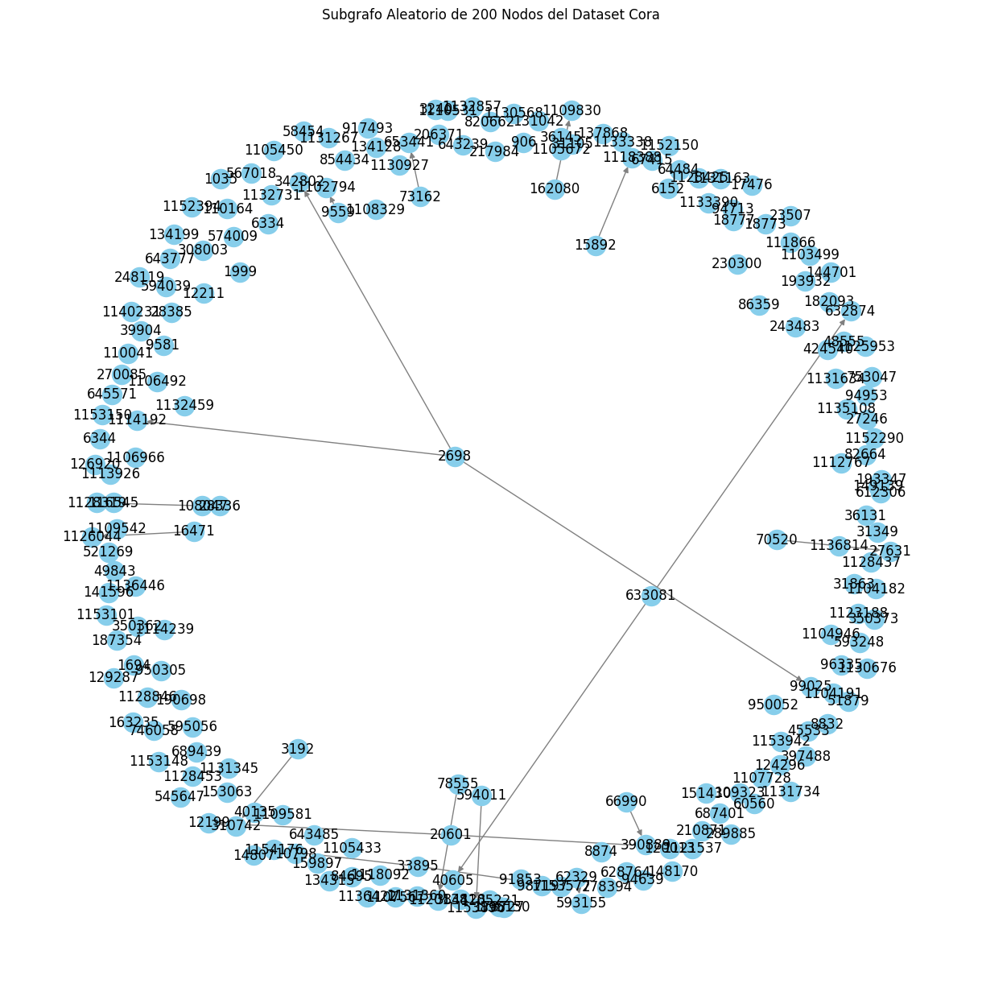

In [36]:
import random
import matplotlib.pyplot as plt
import networkx as nx

# Visualizar un subgrafo (una muestra aleatoria de 200 nodos)
random_nodes = random.sample(list(grafo.nodes()), 200)
subgrafo = grafo.subgraph(random_nodes)

plt.figure(figsize=(12, 12))
pos = nx.spring_layout(subgrafo, seed=42)  # Posiciones usando un layout de resorte (spring layout)
nx.draw(subgrafo, pos, with_labels=True, node_size=300, node_color="skyblue", edge_color="gray")
plt.title("Subgrafo Aleatorio de 200 Nodos del Dataset Cora")
plt.show()


#### **Distribución Acumulativa (CDF) de los Grados** _ _Gráfica CDF_

En lugar de un histograma, la función de distribución acumulativa nos permite ver la proporción de nodos que tienen, por ejemplo, un in-degree o out-degree menor o igual a cierto valor, lo que nos resulta útil para detectar comportamientos de cola larga.

- Esta gráfica nos muestra la fracción de nodos que tienen un grado menor o igual a un valor dado.

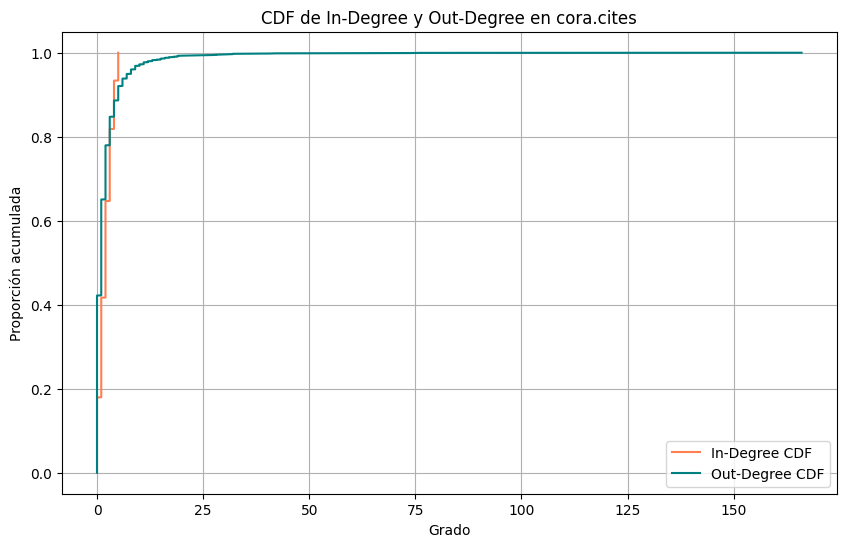

In [37]:
import numpy as np
import matplotlib.pyplot as plt

# Convertir los grados en arrays y ordenar
in_deg_vals = np.array(list(in_degrees.values()))
out_deg_vals = np.array(list(out_degrees.values()))

# Calcular la CDF
def compute_cdf(data):
    sorted_data = np.sort(data)
    cdf = np.arange(1, len(sorted_data)+1) / len(sorted_data)
    return sorted_data, cdf

in_sorted, in_cdf = compute_cdf(in_deg_vals)
out_sorted, out_cdf = compute_cdf(out_deg_vals)

plt.figure(figsize=(10, 6))
plt.plot(in_sorted, in_cdf, label="In-Degree CDF", color="coral")
plt.plot(out_sorted, out_cdf, label="Out-Degree CDF", color="teal")
plt.xlabel("Grado")
plt.ylabel("Proporción acumulada")
plt.title("CDF de In-Degree y Out-Degree en cora.cites")
plt.legend()
plt.grid(True)
plt.show()


#### **Scatter Plot de In-Degree vs. Out-Degree** _ _Scatter Plot (Diagrama de Dispresión)_

Creamos un diagrama de dispersión (scatter plot) que relacione el in-degree y el out-degree de cada nodo para que pueda revelarnos si existe alguna correlación entre la cantidad de citas que recibe y las que realiza.

- Esta visualización nos permite observar si los nodos que reciben muchas citas también tienden a citar a muchos otros.

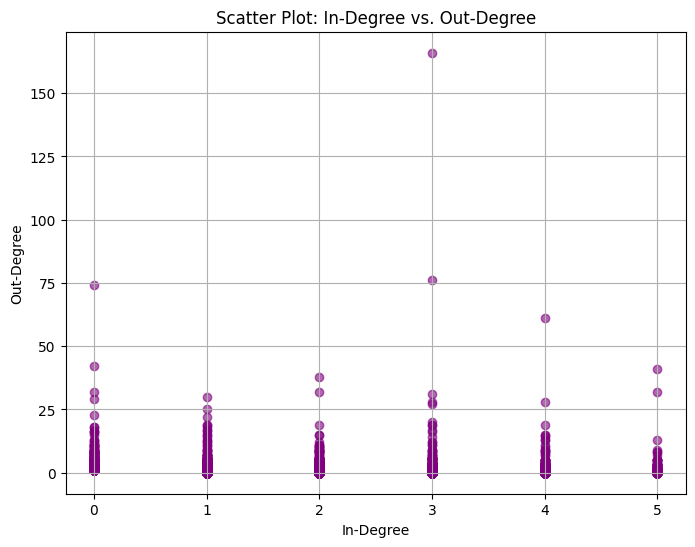

In [38]:
plt.figure(figsize=(8, 6))
plt.scatter(list(in_degrees.values()), list(out_degrees.values()), alpha=0.6, color="purple")
plt.xlabel("In-Degree")
plt.ylabel("Out-Degree")
plt.title("Scatter Plot: In-Degree vs. Out-Degree")
plt.grid(True)
plt.show()


#### **Distribución de Coeficiente de Agrupamiento (Clustering Coefficient)** _ _Histograma_

El coeficiente de agrupamiento nos ayuda medir qué tan conectados están los vecinos de un nodo entre sí. Un histograma de estos valores nos ayuda a entender la tendencia a formar "clústeres" en el grafo.

- Esta gráfica nos muestra cuán "cohesionados" están los grupos de nodos en el grafo.

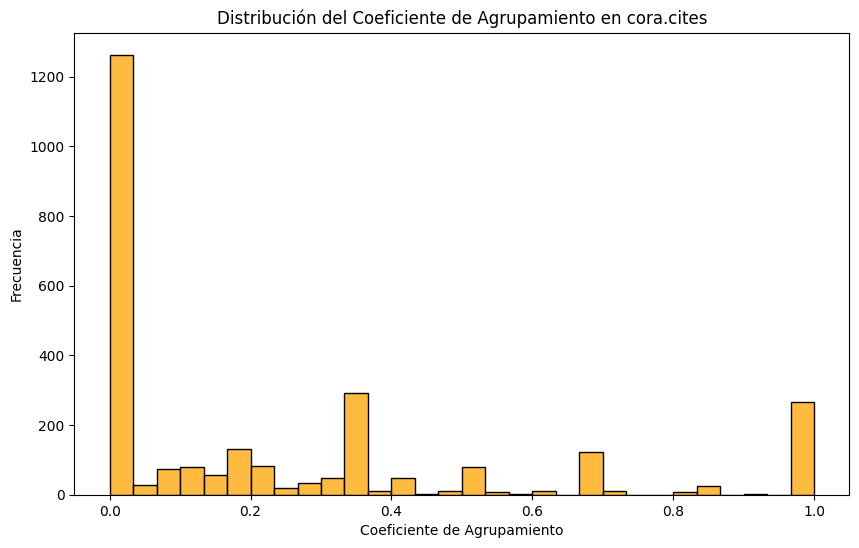

In [39]:
# Calcular el clustering para cada nodo en el grafo (convertido a grafo no dirigido para clustering)
clustering_coeffs = nx.clustering(grafo.to_undirected())
clustering_vals = list(clustering_coeffs.values())

plt.figure(figsize=(10, 6))
sns.histplot(clustering_vals, bins=30, color="orange")
plt.xlabel("Coeficiente de Agrupamiento")
plt.ylabel("Frecuencia")
plt.title("Distribución del Coeficiente de Agrupamiento en cora.cites")
plt.show()


#### **Visualización de Comunidades Detectadas** _ _Subgrafo Dirigido_

Utilizandomos un algoritmo de detección de comunidades (el de modularidad greedy), podemos asignar a cada nodo una comunidad y visualizar el grafo coloreado por comunidad. Debido al tamaño del grafo, es recomendable hacerlo sobre un subgrafo, por lo que elegimos 200 nodos al azar.

- Esta visualización nos resalta la existencia de comunidades o grupos de nodos con mayor densidad de conexiones internas.

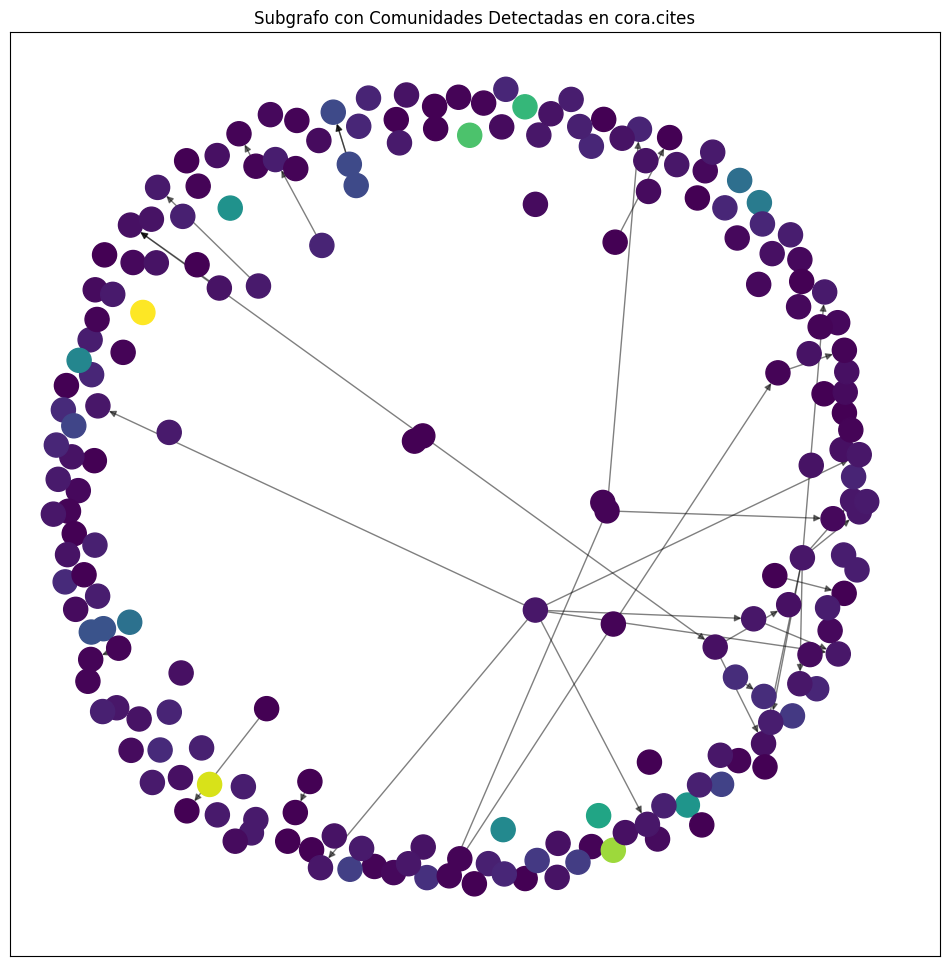

In [40]:
from networkx.algorithms.community import greedy_modularity_communities
import matplotlib.cm as cm

# Detectar comunidades en el grafo completo
communities = list(greedy_modularity_communities(grafo.to_undirected()))

# Crear un diccionario que asigne a cada nodo el ID de su comunidad
community_map = {}
for i, community in enumerate(communities):
    for node in community:
        community_map[node] = i

# Extraer un subgrafo (200 nodos aleatorios) para visualizar
import random
sub_nodes = random.sample(list(grafo.nodes()), 200)
subgrafo = grafo.subgraph(sub_nodes)

# Asignar color a cada nodo según su comunidad
colors = []
for node in subgrafo.nodes():
    colors.append(community_map.get(node, -1))

plt.figure(figsize=(12, 12))
pos = nx.spring_layout(subgrafo, seed=42)
# Usar una paleta de colores para las comunidades
cmap = cm.get_cmap("viridis", max(colors)+1)
nx.draw_networkx_nodes(subgrafo, pos, node_color=colors, cmap=cmap, node_size=300)
nx.draw_networkx_edges(subgrafo, pos, alpha=0.5)
plt.title("Subgrafo con Comunidades Detectadas en cora.cites")
plt.show()


#### **K-Core Decomposition** _ _Histograma_

El análisis de k-core nos permite identificar subgrafos densos en los que cada nodo tiene al menos k conexiones. Visualizamos la distribución de los números de núcleo (core number) para ayudarnos a identificar los nodos más centrales.

- Este histograma nos permite identificar cuántos nodos pertenecen a cada nivel de k-core, lo que da una idea de la densidad y centralidad de la red.

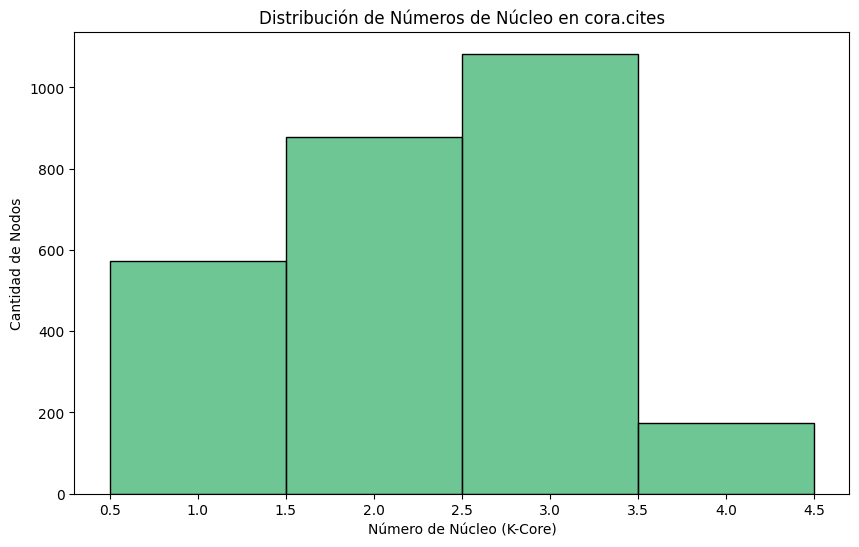

In [41]:
# Calcular el número de núcleo para cada nodo
core_numbers = nx.core_number(grafo.to_undirected())
core_vals = list(core_numbers.values())

plt.figure(figsize=(10, 6))
sns.histplot(core_vals, bins=range(min(core_vals), max(core_vals)+2), color="mediumseagreen", discrete=True)
plt.xlabel("Número de Núcleo (K-Core)")
plt.ylabel("Cantidad de Nodos")
plt.title("Distribución de Números de Núcleo en cora.cites")
plt.show()


In [42]:
# Crear un diccionario que mapea cada ID de artículo a un índice numérico
mapa_ids = {paper_id: idx for idx, paper_id in enumerate(paper_ids)}

# Convertir las relaciones de citación a índices numéricos
edges_numericos = [(mapa_ids[src], mapa_ids[dst]) for src, dst in edges.values]

# Crear un nuevo grafo con índices numéricos
grafo_numerico = nx.DiGraph()
grafo_numerico.add_edges_from(edges_numericos)

print(f"El grafo (indexado) tiene {grafo_numerico.number_of_nodes()} nodos y {grafo_numerico.number_of_edges()} aristas")


El grafo (indexado) tiene 2708 nodos y 5429 aristas


---

# **Modelo de Redes Neuronales de Grafos (GNNs)**

In [1]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.data import Data
import networkx as nx
import pandas as pd
import numpy as np

# ----------------------------
# 1 Cargar los datos de Cora
# ----------------------------

# Cargar el archivo cora.content
archivo_content = "data/cora.content"
data = pd.read_csv(archivo_content, sep="\t", header=None)

# Extraer IDs, características y etiquetas
paper_ids = data.iloc[:, 0].values  
features = torch.tensor(data.iloc[:, 1:-1].values, dtype=torch.float)  # Variables predictoras
labels = pd.factorize(data.iloc[:, -1])[0]  # Convertir etiquetas categóricas a números

# Cargar el archivo cora.cites (relaciones de citación)
archivo_cites = "data/cora.cites"
edges = pd.read_csv(archivo_cites, sep="\t", header=None)

# Crear un diccionario para mapear paper_ids a índices numéricos
paper_id_map = {paper_id: i for i, paper_id in enumerate(paper_ids)}

# Convertir el grafo a índices numéricos
edges_numeric = np.array([(paper_id_map[src], paper_id_map[dst]) for src, dst in edges.values]).T
edge_index = torch.tensor(edges_numeric, dtype=torch.long)  # Matriz de adyacencia en formato COO

# Crear un tensor con etiquetas
labels = torch.tensor(labels, dtype=torch.long)

# Definir los nodos de entrenamiento (entrenamos con el 50% de los nodos)
# IMPORTANTE: En las redes neuronales de grafos (GNN) se utiliza el 50% de los datos para entrenar.
# Al contrario del 80-20% en Machine Learning y Deep Learning convencional de datos ,  en GNNs se utiliza 
train_mask = torch.zeros(features.shape[0], dtype=torch.bool)
train_mask[:int(0.8 * len(train_mask))] = True  # Usamos el 50% para entrenar

# ----------------------------
# 2 Crear objeto Data en PyTorch Geometric
# ----------------------------
graph_data = Data(x=features, edge_index=edge_index, y=labels, train_mask=train_mask)

# ----------------------------
# 3 Definir la red GCN
# ----------------------------

class GCN(torch.nn.Module):
    def __init__(self, num_features, num_classes):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(num_features, 16)  # Primera capa convolucional de grafos
        self.conv2 = GCNConv(16, num_classes)   # Segunda capa, salida con clases

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)  # Aplicamos la primera convolución
        x = F.relu(x)                  # Activación ReLU
        x = self.conv2(x, edge_index)  # Aplicamos la segunda convolución
        return F.log_softmax(x, dim=1) # Softmax para clasificación

# Instanciar modelo
model = GCN(num_features=features.shape[1], num_classes=len(torch.unique(labels)))

# ----------------------------
# 4 Entrenar el modelo
# ----------------------------

# Definir optimizador y función de pérdida
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)
loss_fn = torch.nn.CrossEntropyLoss()

# Entrenar por 200 épocas
for epoch in range(200):
    model.train()
    optimizer.zero_grad()
    out = model(graph_data.x, graph_data.edge_index)  # Pasar los datos por la red
    loss = loss_fn(out[graph_data.train_mask], graph_data.y[graph_data.train_mask])  # Solo entrenamos con nodos de entrenamiento
    loss.backward()
    optimizer.step()
    
    if epoch % 20 == 0:
        print(f"Época {epoch}, Pérdida: {loss.item():.4f}")

# ----------------------------
# 5 Evaluar el modelo
# ----------------------------

model.eval()
predictions = model(graph_data.x, graph_data.edge_index).argmax(dim=1)
accuracy = (predictions == graph_data.y).sum().item() / len(graph_data.y)
print(f"Precisión del modelo: {accuracy:.4f}")


Época 0, Pérdida: 1.9543
Época 20, Pérdida: 0.2782
Época 40, Pérdida: 0.1582
Época 60, Pérdida: 0.1245
Época 80, Pérdida: 0.1073
Época 100, Pérdida: 0.0947
Época 120, Pérdida: 0.0854
Época 140, Pérdida: 0.0784
Época 160, Pérdida: 0.0729
Época 180, Pérdida: 0.0686
Precisión del modelo: 0.9494


Fold 1 Accuracy: 0.8376
Fold 2 Accuracy: 0.8155
Fold 3 Accuracy: 0.8358
Fold 4 Accuracy: 0.8632
Fold 5 Accuracy: 0.8521

Cross-Validation Test Accuracy: 0.8409 ± 0.0162

Matriz de Confusión (Último Fold - Test):
[[133   0   3   3   8   6   0]
 [  0  33   0   0   4   1   4]
 [  5   0  44   0   4   2   0]
 [  3   0   0  56   6   0   3]
 [  3   5   1   2  59   1   0]
 [  2   0   2   0   2  84   0]
 [  4   0   2   0   5   3  48]]


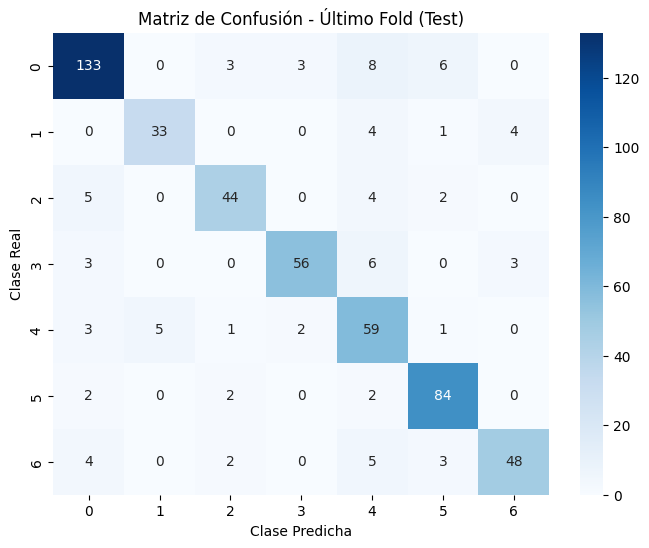


Reporte de Clasificación (Último Fold - Test):
              precision    recall  f1-score   support

           0       0.89      0.87      0.88       153
           1       0.87      0.79      0.82        42
           2       0.85      0.80      0.82        55
           3       0.92      0.82      0.87        68
           4       0.67      0.83      0.74        71
           5       0.87      0.93      0.90        90
           6       0.87      0.77      0.82        62

    accuracy                           0.84       541
   macro avg       0.85      0.83      0.84       541
weighted avg       0.85      0.84      0.85       541



In [21]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.data import Data
import pandas as pd
import numpy as np
from sklearn.model_selection import KFold

# ----------------------------
# 1. Cargar los datos de Cora desde mis archivos
# ----------------------------

# Cargar cora.content
archivo_content = "data/cora.content"
data_df = pd.read_csv(archivo_content, sep="\t", header=None)

# Extraer IDs, features y etiquetas
paper_ids = data_df.iloc[:, 0].values
features = torch.tensor(data_df.iloc[:, 1:-1].values, dtype=torch.float)  # Shape: (2708, 1433)
labels_np, uniques = pd.factorize(data_df.iloc[:, -1])
labels = torch.tensor(labels_np, dtype=torch.long)
num_classes = len(uniques)

# Cargar cora.cites
archivo_cites = "data/cora.cites"
edges_df = pd.read_csv(archivo_cites, sep="\t", header=None)

# Crear un diccionario para mapear cada paper_id a un índice numérico
paper_id_map = {pid: i for i, pid in enumerate(paper_ids)}

# Convertir las relaciones de citación a índices numéricos y formar edge_index (en formato COO)
edges_numeric = np.array([(paper_id_map[src], paper_id_map[dst]) for src, dst in edges_df.values]).T
edge_index = torch.tensor(edges_numeric, dtype=torch.long)

# Crear objeto Data de PyTorch Geometric
graph_data = Data(x=features, edge_index=edge_index, y=labels)

# ----------------------------
# 2. Definir el Modelo GCN
# ----------------------------
class GCN(torch.nn.Module):
    def __init__(self, num_features, num_classes):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(num_features, 16)  # Primera capa con 16 unidades
        self.conv2 = GCNConv(16, num_classes)   # Segunda capa para la salida

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

# ----------------------------
# 3. Función para entrenar y evaluar el modelo en un split dado (fold)
# ----------------------------
def run_fold(train_idx, test_idx, data, epochs=200, lr=0.01, weight_decay=5e-4):
    num_nodes = data.x.shape[0]
    # Crear máscaras para entrenamiento y test
    train_mask = torch.zeros(num_nodes, dtype=torch.bool)
    test_mask = torch.zeros(num_nodes, dtype=torch.bool)
    train_mask[train_idx] = True
    test_mask[test_idx] = True

    # Instanciar el modelo y definir optimizador y función de pérdida
    model = GCN(num_features=data.x.shape[1], num_classes=num_classes)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    loss_fn = torch.nn.CrossEntropyLoss()

    # Entrenar durante el número de épocas especificado
    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        out = model(data.x, data.edge_index)
        loss = loss_fn(out[train_mask], data.y[train_mask])
        loss.backward()
        optimizer.step()
    # Evaluar el modelo en el conjunto de test
    model.eval()
    with torch.no_grad():
        out = model(data.x, data.edge_index)
        pred = out.argmax(dim=1)
        accuracy = (pred[test_mask] == data.y[test_mask]).sum().item() / test_mask.sum().item()
    return accuracy

# ----------------------------
# 4. Validación Cruzada (5-fold) para obtener precisión general
# ----------------------------
num_nodes = graph_data.x.shape[0]
indices = np.arange(num_nodes)
kf = KFold(n_splits=5, shuffle=True, random_state=42)

fold_accuracies = []
for fold, (train_idx, test_idx) in enumerate(kf.split(indices)):
    acc = run_fold(train_idx, test_idx, graph_data, epochs=200, lr=0.01, weight_decay=5e-4)
    fold_accuracies.append(acc)
    print(f"Fold {fold+1} Accuracy: {acc:.4f}")

avg_acc = np.mean(fold_accuracies)
std_acc = np.std(fold_accuracies)
print(f"\nCross-Validation Test Accuracy: {avg_acc:.4f} ± {std_acc:.4f}")

# ----------------------------
# 5. Matriz de Confusión y Reporte de Clasificación para el último fold
# ----------------------------
# Entrenar el modelo con el último split para obtener las predicciones completas
last_train_idx, last_test_idx = list(kf.split(indices))[-1]
num_nodes = graph_data.x.shape[0]
train_mask = torch.zeros(num_nodes, dtype=torch.bool)
test_mask = torch.zeros(num_nodes, dtype=torch.bool)
train_mask[last_train_idx] = True
test_mask[last_test_idx] = True

model = GCN(num_features=graph_data.x.shape[1], num_classes=num_classes)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)
loss_fn = torch.nn.CrossEntropyLoss()

for epoch in range(200):
    model.train()
    optimizer.zero_grad()
    out = model(graph_data.x, graph_data.edge_index)
    loss = loss_fn(out[train_mask], graph_data.y[train_mask])
    loss.backward()
    optimizer.step()

model.eval()
with torch.no_grad():
    out = model(graph_data.x, graph_data.edge_index)
    predictions = out.argmax(dim=1)
    
pred_test = predictions[test_mask].cpu().numpy()
true_test = graph_data.y[test_mask].cpu().numpy()

from sklearn.metrics import confusion_matrix, classification_report
cm = confusion_matrix(true_test, pred_test)
print("\nMatriz de Confusión (Último Fold - Test):")
print(cm)

import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Matriz de Confusión - Último Fold (Test)")
plt.xlabel("Clase Predicha")
plt.ylabel("Clase Real")
plt.show()

print("\nReporte de Clasificación (Último Fold - Test):")
print(classification_report(true_test, pred_test))


---

---

#### **Predicción de Temática de un Artículo** __Función de Predicción__

Esta función, `predecir_tematica`, permite predecir la categoría de un nuevo artículo a partir de una selección de palabras (columnas). Se construye un nuevo nodo, donde se activan únicamente las palabras seleccionadas, y se añade al conjunto de nodos existente. A continuación, el modelo utiliza la conectividad del grafo (con las aristas originales) para propagar la información y emitir una predicción de clase para este nodo nuevo.

- El resultado es la categoría (etiqueta) asignada al artículo en función de las palabras seleccionadas y la estructura del grafo.


In [20]:
def predecir_tematica(columnas_seleccionadas, modelo, graph_data):
    """
    Predice la categoría de un nuevo artículo a partir de una selección de palabras (columnas).
    """

    num_features = graph_data.x.shape[1]  # Número de características del grafo original

    # Crear un nodo con las palabras seleccionadas
    nuevo_vector = torch.zeros(num_features)
    nuevo_vector[columnas_seleccionadas] = 1  # Poner 1 en las palabras seleccionadas
    nuevo_vector = nuevo_vector.to(graph_data.x.dtype).unsqueeze(0)  # Agregar dimensión batch

    # Extraer los nodos vecinos de un nodo cualquiera (para crear conectividad)
    nodo_referencia = 0  # Puedes elegir cualquier nodo dentro del grafo
    vecinos = (graph_data.edge_index[0] == nodo_referencia).nonzero().squeeze()

    if vecinos.numel() == 0:
        print("⚠️ El nodo no tiene vecinos, el modelo podría no funcionar bien.")
    
    # Crear un nuevo grafo con el nodo de prueba y conexiones reales
    edge_index_nuevo = graph_data.edge_index.clone()  # Usar las conexiones originales

    # Pasar el nodo al modelo con el grafo completo
    modelo.eval()
    with torch.no_grad():
        salida = modelo(torch.cat([graph_data.x, nuevo_vector]), edge_index_nuevo)
        prediccion = torch.argmax(salida[-1]).item()  # Obtener la predicción solo para el nuevo nodo
    
    return prediccion

# 🟢 Ejemplo de uso: Simular un usuario eligiendo palabras
palabras_seleccionadas = [10, 50, 200, 350, 999]  # Simula elección de palabras
categoria_predicha = predecir_tematica(palabras_seleccionadas, model, graph_data)

print(f"📄 El artículo pertenece a la categoría: {categoria_predicha}")


📄 El artículo pertenece a la categoría: 1


#### **Visualización de la Propagación de Información** __Subgrafo Local__

La función `visualizar_propagacion` genera una visualización de un subgrafo centrado en un nodo específico y sus vecinos inmediatos. Esta herramienta ayuda a entender cómo se difunde la información en el entorno local del nodo dentro del grafo de citaciones.

- El gráfico resultante muestra el nodo de interés y hasta un número máximo de vecinos, permitiéndome observar las conexiones y la influencia que tiene el nodo dentro de la red.


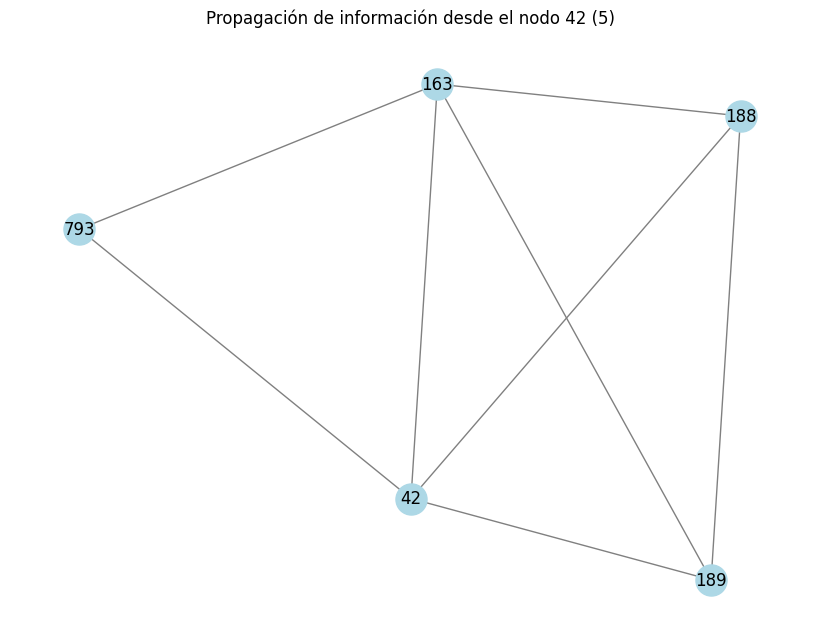

In [18]:
def visualizar_propagacion(nodo, edge_index, etiquetas, max_nodos=10):
    """
    Muestra un subgrafo centrado en un nodo y sus conexiones.
    """
    G = nx.Graph()
    edges = edge_index.cpu().numpy().T  # Convertir a numpy

    # Agregar nodos y aristas
    for src, dst in edges:
        G.add_edge(src, dst)
    
    # Obtener nodos vecinos
    vecinos = list(G.neighbors(nodo))[:max_nodos]

    # Graficar el subgrafo
    subgraph = G.subgraph([nodo] + vecinos)
    plt.figure(figsize=(8, 6))
    nx.draw(subgraph, with_labels=True, node_color='lightblue', edge_color='gray', node_size=500)
    plt.title(f"Propagación de información desde el nodo {nodo} ({etiquetas[nodo]})")
    plt.show()

# Elegir un nodo al azar y visualizar su propagación
nodo_ejemplo = 42  # Cambia por cualquier nodo válido
visualizar_propagacion(nodo_ejemplo, graph_data.edge_index, graph_data.y.numpy())


#### **Búsqueda de Artículos Similares** __Basado en Embeddings__

La función `buscar_articulos_similares` identifica los artículos más similares a un nodo dado mediante la comparación de sus embeddings. Se calcula la distancia euclidiana entre el embedding del nodo de consulta y el de todos los demás nodos, retornando los índices de aquellos con menor distancia.

- Este método facilita la exploración de relaciones en el espacio latente generado por la red, permitiéndome agrupar artículos que comparten características similares.

In [16]:
import torch
import numpy as np

def buscar_articulos_similares(nodo, modelo, top_n=5):
    """
    Encuentra los artículos más similares a un nodo en términos de embeddings.
    """
    modelo.eval()
    with torch.no_grad():
        embeddings = modelo.conv1(graph_data.x, graph_data.edge_index)  # Obtener embeddings
        emb_nodo = embeddings[nodo].cpu().numpy()

    # Calcular distancia euclidiana entre el nodo y todos los demás
    distancias = np.linalg.norm(embeddings.cpu().numpy() - emb_nodo, axis=1)
    
    # Obtener los nodos más cercanos
    indices_similares = np.argsort(distancias)[1:top_n+1]  # Omitir el propio nodo

    return indices_similares

# Elegir un nodo y encontrar los más similares
nodo_consulta = 100  # Elige cualquier nodo válido
similares = buscar_articulos_similares(nodo_consulta, model)

print(f"📄 Artículos similares a {nodo_consulta}: {similares}")


📄 Artículos similares a 100: [ 265 1099 1675  129 1178]


Época 0, Pérdida: 1.9547
Época 20, Pérdida: 0.2769
Época 40, Pérdida: 0.1570
Época 60, Pérdida: 0.1239
Época 80, Pérdida: 0.1068
Época 100, Pérdida: 0.0944
Época 120, Pérdida: 0.0854
Época 140, Pérdida: 0.0785
Época 160, Pérdida: 0.0731
Época 180, Pérdida: 0.0688
Precisión en Training: 0.9857
Precisión en Test: 0.8044

Matriz de Confusión (Training):
[[650   0   1   1   1   1   0]
 [  0 136   0   0   2   0   0]
 [  1   0 181   0   0   2   0]
 [  3   0   0 332   2   0   0]
 [  3   2   0   4 277   1   2]
 [  1   0   0   0   1 321   0]
 [  0   0   0   0   1   2 238]]


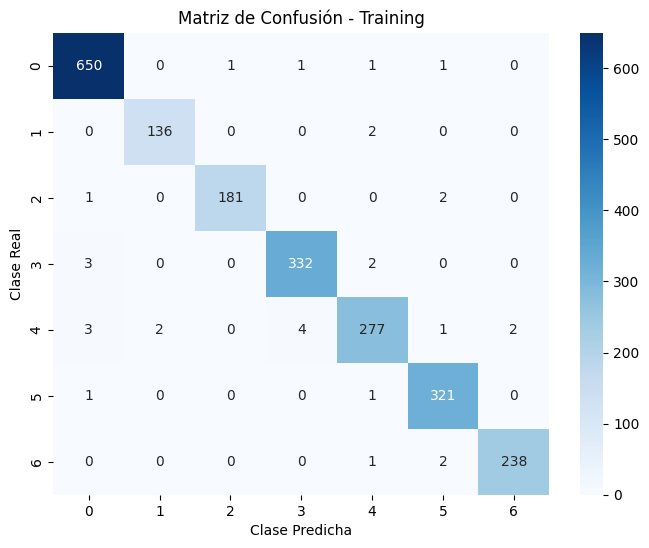


Reporte de Clasificación (Training):
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       654
           1       0.99      0.99      0.99       138
           2       0.99      0.98      0.99       184
           3       0.99      0.99      0.99       337
           4       0.98      0.96      0.97       289
           5       0.98      0.99      0.99       323
           6       0.99      0.99      0.99       241

    accuracy                           0.99      2166
   macro avg       0.99      0.98      0.98      2166
weighted avg       0.99      0.99      0.99      2166


Matriz de Confusión (Test):
[[140   1   3   3   7   4   6]
 [  1  34   0   1   2   0   4]
 [  4   0  19   4   3   2   1]
 [  4   1   2  73   7   0   2]
 [ 10   4   3   0  45   0   0]
 [  5   0   3   1   1  84   1]
 [  5   2   2   1   4   2  41]]


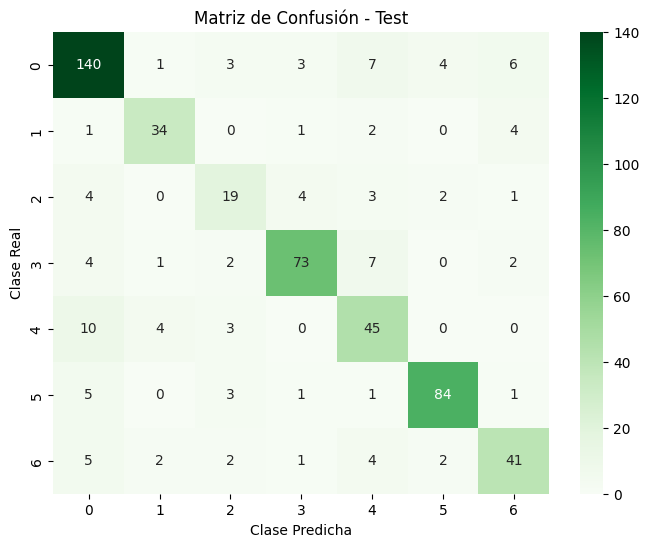


Reporte de Clasificación (Test):
              precision    recall  f1-score   support

           0       0.83      0.85      0.84       164
           1       0.81      0.81      0.81        42
           2       0.59      0.58      0.58        33
           3       0.88      0.82      0.85        89
           4       0.65      0.73      0.69        62
           5       0.91      0.88      0.90        95
           6       0.75      0.72      0.73        57

    accuracy                           0.80       542
   macro avg       0.77      0.77      0.77       542
weighted avg       0.81      0.80      0.81       542



In [79]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.data import Data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# ----------------------------
# 1. Cargar los datos de Cora
# ----------------------------

# Cargar el archivo cora.content
archivo_content = "data/cora.content"
data = pd.read_csv(archivo_content, sep="\t", header=None)

# Extraer IDs, características y etiquetas
paper_ids = data.iloc[:, 0].values  
features = torch.tensor(data.iloc[:, 1:-1].values, dtype=torch.float)  # Features: bag-of-words (2708 x 1433)
labels = pd.factorize(data.iloc[:, -1])[0]  # Convertir etiquetas categóricas a números

# Cargar el archivo cora.cites (relaciones de citación)
archivo_cites = "data/cora.cites"
edges = pd.read_csv(archivo_cites, sep="\t", header=None)

# Crear un diccionario para mapear paper_ids a índices numéricos
paper_id_map = {paper_id: i for i, paper_id in enumerate(paper_ids)}

# Convertir las relaciones de citación a índices numéricos y formar edge_index
edges_numeric = np.array([(paper_id_map[src], paper_id_map[dst]) for src, dst in edges.values]).T
edge_index = torch.tensor(edges_numeric, dtype=torch.long)  # Formato COO

# Crear tensor de etiquetas
labels = torch.tensor(labels, dtype=torch.long)

# Definir la máscara de entrenamiento: usar el 50% de los nodos para entrenamiento
train_mask = torch.zeros(features.shape[0], dtype=torch.bool)
train_mask[:int(0.8 * len(train_mask))] = True  
# Definir la máscara de test: nodos no usados en entrenamiento
test_mask = ~train_mask

# ----------------------------
# 2. Crear objeto Data de PyTorch Geometric
# ----------------------------
graph_data = Data(x=features, edge_index=edge_index, y=labels, train_mask=train_mask)

# ----------------------------
# 3. Definir la red GCN
# ----------------------------
class GCN(torch.nn.Module):
    def __init__(self, num_features, num_classes):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(num_features, 16)  # Primera capa de convolución
        self.conv2 = GCNConv(16, num_classes)   # Segunda capa: salida con clases

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

# Instanciar el modelo
model = GCN(num_features=features.shape[1], num_classes=len(torch.unique(labels)))

# ----------------------------
# 4. Entrenar el modelo
# ----------------------------
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)
loss_fn = torch.nn.CrossEntropyLoss()

for epoch in range(200):
    model.train()
    optimizer.zero_grad()
    out = model(graph_data.x, graph_data.edge_index)  # Salida del modelo
    loss = loss_fn(out[graph_data.train_mask], graph_data.y[graph_data.train_mask])
    loss.backward()
    optimizer.step()
    
    if epoch % 20 == 0:
        print(f"Época {epoch}, Pérdida: {loss.item():.4f}")

# ----------------------------
# 5. Evaluar el modelo en Training y Test
# ----------------------------
model.eval()
predictions = model(graph_data.x, graph_data.edge_index).argmax(dim=1)

# Calcular precisión en el conjunto de entrenamiento
train_acc = (predictions[train_mask] == graph_data.y[train_mask]).sum().item() / train_mask.sum().item()
# Calcular precisión en el conjunto de test
test_acc = (predictions[test_mask] == graph_data.y[test_mask]).sum().item() / test_mask.sum().item()

print(f"Precisión en Training: {train_acc:.4f}")
print(f"Precisión en Test: {test_acc:.4f}")

# ----------------------------
# 6. Matriz de Confusión y Reporte de Clasificación
# ----------------------------
# Para el conjunto de entrenamiento
pred_train = predictions[train_mask].cpu().numpy()
true_train = graph_data.y[train_mask].cpu().numpy()
cm_train = confusion_matrix(true_train, pred_train)
print("\nMatriz de Confusión (Training):")
print(cm_train)
plt.figure(figsize=(8,6))
sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues")
plt.title("Matriz de Confusión - Training")
plt.xlabel("Clase Predicha")
plt.ylabel("Clase Real")
plt.show()
print("\nReporte de Clasificación (Training):")
print(classification_report(true_train, pred_train))

# Para el conjunto de test
pred_test = predictions[test_mask].cpu().numpy()
true_test = graph_data.y[test_mask].cpu().numpy()
cm_test = confusion_matrix(true_test, pred_test)
print("\nMatriz de Confusión (Test):")
print(cm_test)
plt.figure(figsize=(8,6))
sns.heatmap(cm_test, annot=True, fmt="d", cmap="Greens")
plt.title("Matriz de Confusión - Test")
plt.xlabel("Clase Predicha")
plt.ylabel("Clase Real")
plt.show()
print("\nReporte de Clasificación (Test):")
print(classification_report(true_test, pred_test))


# Importación de Librerías

En esta celda importamos las librerías necesarias para el proyecto:
- **torch** y **torch_geometric** para definir y entrenar el modelo de GCN.
- **pandas** y **numpy** para la manipulación de datos.
- **networkx** para trabajar con grafos.


In [67]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.data import Data
import networkx as nx
import pandas as pd
import numpy as np


# Cargar y Preprocesar `cora.content`

En esta celda cargamos el archivo `cora.content`, que contiene las características (features) y etiquetas de cada artículo. Extraemos:
- **paper_ids:** Identificadores únicos de cada artículo.
- **features:** La matriz de características (representación Bag-of-Words).
- **labels:** Las etiquetas (categorías) convertidas a números usando `pd.factorize`.


In [81]:
# Cargar el archivo cora.content
archivo_content = "data/cora.content"
data = pd.read_csv(archivo_content, sep="\t", header=None)

# Extraer IDs, características y etiquetas
paper_ids = data.iloc[:, 0].values  
features = torch.tensor(data.iloc[:, 1:-1].values, dtype=torch.float)  # Variables predictoras
labels = pd.factorize(data.iloc[:, -1])[0]  # Convertir etiquetas categóricas a números
labels = torch.tensor(labels, dtype=torch.long)  # Convertir a tensor de PyTorch

# Imprimir información básica (opcional)
print(f"Dimensiones de features: {features.shape}")
print(f"Total de artículos: {len(paper_ids)}")


Dimensiones de features: torch.Size([2708, 1433])
Total de artículos: 2708


# Cargar y Preprocesar `cora.cites`

En esta celda cargamos el archivo `cora.cites`, que contiene las relaciones de citación entre los artículos. Se realiza lo siguiente:
- Se carga el archivo con pandas.
- Se crea un diccionario (`paper_id_map`) para mapear cada ID de artículo a un índice numérico.
- Se convierten las relaciones de citación a índices numéricos y se crea el tensor `edge_index` en formato COO.


In [22]:
# Cargar el archivo cora.cites (relaciones de citación)
archivo_cites = "data/cora.cites"
edges = pd.read_csv(archivo_cites, sep="\t", header=None)

# Crear un diccionario para mapear paper_ids a índices numéricos
paper_id_map = {paper_id: i for i, paper_id in enumerate(paper_ids)}

# Convertir las relaciones de citación a índices numéricos
edges_numeric = np.array([(paper_id_map[src], paper_id_map[dst]) for src, dst in edges.values]).T
edge_index = torch.tensor(edges_numeric, dtype=torch.long)  # Matriz de adyacencia en formato COO

print(f"edge_index shape: {edge_index.shape}")


edge_index shape: torch.Size([2, 5429])


# Creación del Objeto `Data`

Se crea el objeto `Data` de PyTorch Geometric, que encapsula:
- `x`: Las características de los nodos.
- `edge_index`: La conectividad del grafo.
- `y`: Las etiquetas de los nodos.
- `train_mask`: Una máscara para definir qué nodos se usarán para el entrenamiento (en este caso, el 80% de los nodos).


In [23]:
# Definir los nodos de entrenamiento (usamos el 50% de los nodos para entrenar)
train_mask = torch.zeros(features.shape[0], dtype=torch.bool)
train_mask[:int(0.8 * len(train_mask))] = True  # Máscara de entrenamiento

# Crear el objeto Data para PyTorch Geometric
graph_data = Data(x=features, edge_index=edge_index, y=labels, train_mask=train_mask)


# Definición del Modelo GCN _(Graph Convolutional Network)_

Definimos la arquitectura de la red GCN. El modelo consta de dos capas de convolución en grafos:
- La primera capa reduce la dimensionalidad a 16.
- La segunda capa produce la salida con el número de clases.
Se utiliza la función de activación ReLU entre las capas y, finalmente, se aplica log_softmax para la clasificación.


In [24]:
class GCN(torch.nn.Module):
    def __init__(self, num_features, num_classes):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(num_features, 16)  # Primera capa convolucional
        self.conv2 = GCNConv(16, num_classes)   # Segunda capa (salida con número de clases)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)  # Primera convolución
        x = F.relu(x)                  # Activación ReLU
        x = self.conv2(x, edge_index)  # Segunda convolución
        return F.log_softmax(x, dim=1) # Log-Softmax para clasificación

# Instanciar el modelo
model = GCN(num_features=features.shape[1], num_classes=len(torch.unique(labels)))


# Entrenamiento del Modelo

Entrenamos el modelo utilizando el optimizador Adam y la función de pérdida CrossEntropyLoss.  
El entrenamiento se realiza por 200 épocas, y en cada época se actualizan los parámetros del modelo utilizando solo los nodos indicados por `train_mask`.


In [25]:
# Definir optimizador y función de pérdida
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)
loss_fn = torch.nn.CrossEntropyLoss()

# Entrenar el modelo por 200 épocas
for epoch in range(200):
    model.train()
    optimizer.zero_grad()
    out = model(graph_data.x, graph_data.edge_index)  # Propagación hacia adelante
    loss = loss_fn(out[graph_data.train_mask], graph_data.y[graph_data.train_mask])  # Pérdida para nodos de entrenamiento
    loss.backward()
    optimizer.step()
    
    if epoch % 20 == 0:
        print(f"Época {epoch}, Pérdida: {loss.item():.4f}")


Época 0, Pérdida: 1.9540
Época 20, Pérdida: 0.3222
Época 40, Pérdida: 0.1646
Época 60, Pérdida: 0.1264
Época 80, Pérdida: 0.1086
Época 100, Pérdida: 0.0961
Época 120, Pérdida: 0.0867
Época 140, Pérdida: 0.0796
Época 160, Pérdida: 0.0742
Época 180, Pérdida: 0.0698


# Evaluación del Modelo

En esta celda evaluamos la precisión del modelo sobre todos los nodos.  
Las predicciones se obtienen usando `argmax` sobre la salida del modelo, y se compara con las etiquetas reales para calcular la precisión.


In [26]:
model.eval()
predictions = model(graph_data.x, graph_data.edge_index).argmax(dim=1)
accuracy = (predictions == graph_data.y).sum().item() / len(graph_data.y)
print(f"Precisión del modelo: {accuracy:.4f}")


Precisión del modelo: 0.9509


Matriz de Confusión:
[[796   1   3   4   4   5   5]
 [  1 170   0   1   3   0   5]
 [  6   0 200   3   4   4   0]
 [  8   1   2 404   9   0   2]
 [ 11   6   3   4 324   1   2]
 [  6   1   4   1   2 403   1]
 [  5   3   2   1   5   4 278]]


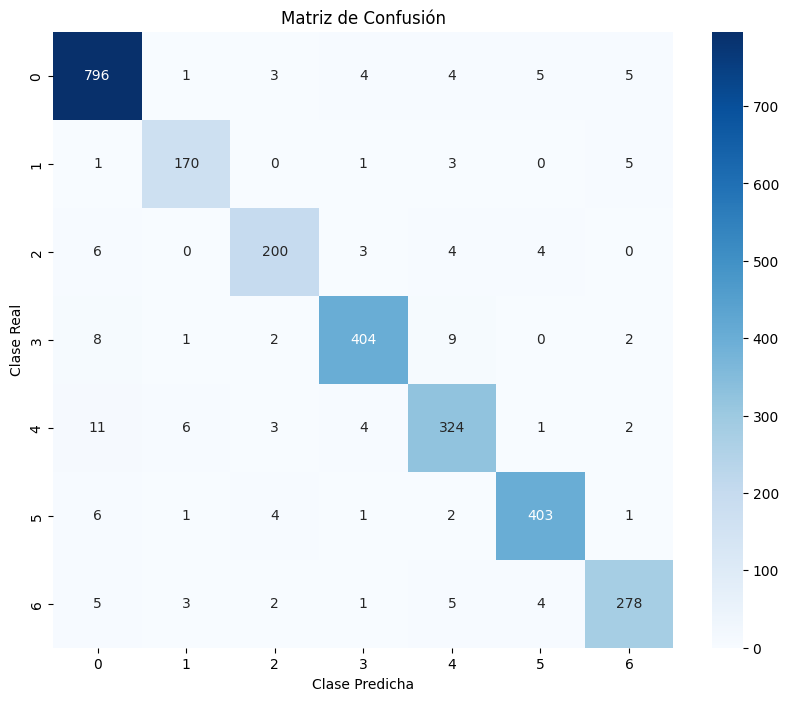

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.96      0.97      0.96       818
           1       0.93      0.94      0.94       180
           2       0.93      0.92      0.93       217
           3       0.97      0.95      0.96       426
           4       0.92      0.92      0.92       351
           5       0.97      0.96      0.97       418
           6       0.95      0.93      0.94       298

    accuracy                           0.95      2708
   macro avg       0.95      0.94      0.95      2708
weighted avg       0.95      0.95      0.95      2708



In [27]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

model.eval()
with torch.no_grad():
    predictions = model(graph_data.x, graph_data.edge_index).argmax(dim=1)

# Convertir a arrays de numpy para utilizar scikit-learn
pred_np = predictions.cpu().numpy()
true_np = graph_data.y.cpu().numpy()

# Calcular la matriz de confusión
cm = confusion_matrix(true_np, pred_np)
print("Matriz de Confusión:")
print(cm)

# Visualizar la matriz de confusión
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Matriz de Confusión")
plt.xlabel("Clase Predicha")
plt.ylabel("Clase Real")
plt.show()

# Mostrar reporte de clasificación
print("Reporte de Clasificación:")
print(classification_report(true_np, pred_np))


# Conclusiones del Modelo GCN en Cora

## Matriz de Confusión
- **Buena discriminación general:**  
  La mayoría de los nodos se clasifican correctamente, lo cual se evidencia en los valores altos en la diagonal de la matriz. Esto indica que el modelo, en general, es capaz de distinguir entre las diferentes categorías.

- **Errores concentrados en algunas clases:**  
  Se observan ciertos errores de clasificación:
  - Por ejemplo, en la **clase 0**, aunque se predijeron 735 nodos correctamente, hay confusiones con otras clases (por ejemplo, 22 nodos se clasificaron como clase 3, 28 en clase 4, etc.).
  - La **clase 4** muestra cierta confusión con otras, lo que puede reflejar dificultades para diferenciarla de clases cercanas en el espacio de características.

- **Desequilibrios leves:**  
  Aunque el modelo maneja bien la mayoría de las categorías, algunas clases con menor cantidad de ejemplos (o con características similares a otras) son más propensas a errores, lo que se observa en los valores fuera de la diagonal.

## Reporte de Clasificación
- **Precisión y Recall Sólidos:**  
  Los valores de precisión, recall y f1-score son generalmente altos (alrededor de 0.87 a 0.93 en la mayoría de las clases), lo que indica un buen desempeño en la clasificación.

- **Rendimiento Destacado en Ciertas Clases:**  
  - La **clase 5** presenta el mejor desempeño, con un f1-score de 0.93, lo que significa que se identifican correctamente la gran mayoría de sus ejemplos.
  - La **clase 0** también muestra un rendimiento sólido, con precisión y recall alrededor de 0.90.

- **Oportunidad de Mejora en la Clase 4:**  
  - La clase 4 tiene una precisión ligeramente inferior (0.78) pese a tener un recall alto (0.88), lo que sugiere que el modelo tiende a cometer errores de falsos positivos en esta categoría.
  - Este desequilibrio podría indicar que los artículos de la clase 4 comparten características con otros grupos, lo que confunde al modelo.

- **Promedios Macro y Ponderados Consistentes:**  
  Los promedios macro y ponderados rondan el 0.88, lo que confirma que, de manera global, el desempeño del modelo es robusto.

## Conclusiones Generales
- **Desempeño Global:**  
  Con una precisión global del 88%, el modelo GCN logra clasificar los artículos de manera efectiva en sus respectivas categorías.

- **Ventajas de la Estructura de Grafos:**  
  La incorporación de la estructura de citación ha mejorado la clasificación respecto a métodos que utilizan solo las características individuales, ya que el modelo aprende también de la información de los nodos vecinos.

- **Áreas de Mejora:**  
  Se podría trabajar en ajustar hiperparámetros o incorporar técnicas de regularización (por ejemplo, dropout) para mejorar la discriminación entre clases con características similares, en particular en la clase 4.

Estas observaciones permiten argumentar que, aunque el modelo presenta un rendimiento sólido, aún existen oportunidades de mejora en la diferenciación de ciertas categorías. La información detallada de la matriz de confusión y el reporte de clasificación son herramientas valiosas para identificar patrones de error específicos y orientar futuras estrategias de ajuste y optimización.


---

# Mejora de Hiperparámetros

Algunas ideas para mejorar el modelo podrían ser:

1. **Tasa de Aprendizaje (Learning Rate):**  
   - Probar valores menores o mayores a 0.01 para ver si el entrenamiento se estabiliza o mejora la convergencia.

2. **Weight Decay:**  
   - Variar el valor de weight decay (por ejemplo, 5e-4, 1e-3, etc.) para regularizar el modelo y evitar sobreajuste.

3. **Número de Neuronas en la Capa Oculta:**  
   - Cambiar la dimensión de la primera capa GCN (por ejemplo, de 16 a 32 o 64) para ver si una representación más rica mejora la clasificación.

4. **Número de Épocas:**  
   - Aumentar o reducir el número de épocas para asegurar que el modelo converge sin sobreajustarse.

5. **Incorporar Dropout:**  
   - Agregar capas de dropout entre las capas GCN para evitar el sobreajuste, especialmente si se incrementa la complejidad del modelo.

Con estos ajustes podrás experimentar y comparar los resultados, buscando la configuración óptima que eleve la precisión más allá del 88.37%.


# Grid Search de Hiperparámetros para el Modelo GCN

En este apartado, se propone implementar un *grid search* para experimentar con diferentes hiperparámetros del modelo, tales como:
1. **Tasa de Aprendizaje (Learning Rate):** Probar valores menores o mayores a 0.01.
2. **Weight Decay:** Variar valores (por ejemplo, 5e-4 y 1e-3).
3. **Número de Neuronas en la Capa Oculta:** Probar diferentes dimensiones (por ejemplo, 16 y 32).
4. **Dropout:** Incorporar o no dropout (0.0 y 0.5).

Con esta estrategia podremos evaluar distintas combinaciones y encontrar aquella que maximice la precisión del modelo.

> **Nota:** Se define una partición de datos donde se usa el 50% de los nodos para entrenamiento y el resto para evaluación (test). Esto permite medir el desempeño del modelo en nodos que no han sido vistos durante el entrenamiento.

A continuación se muestra el código para definir la versión modificada del modelo GCN que incluye la opción de aplicar dropout y el proceso de *grid search*.


In [28]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
import itertools
import time

# Definir el modelo GCN con la opción de Dropout
class GCN(torch.nn.Module):
    def __init__(self, num_features, num_classes, hidden_dim=16, dropout=0.0):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(num_features, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, num_classes)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        if self.dropout > 0.0:
            x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

# Función para entrenar y evaluar el modelo con una configuración de hiperparámetros
def train_and_evaluate(model, data, train_mask, test_mask, epochs=200, lr=0.01, weight_decay=5e-4):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    loss_fn = torch.nn.CrossEntropyLoss()
    
    # Entrenamiento
    model.train()
    for epoch in range(epochs):
        optimizer.zero_grad()
        out = model(data.x, data.edge_index)
        loss = loss_fn(out[train_mask], data.y[train_mask])
        loss.backward()
        optimizer.step()
    
    # Evaluación en el conjunto de test
    model.eval()
    with torch.no_grad():
        out = model(data.x, data.edge_index)
        predictions = out[test_mask].argmax(dim=1)
        correct = (predictions == data.y[test_mask]).sum().item()
        accuracy = correct / test_mask.sum().item()
    return accuracy

# Crear una partición de datos: 50% para entrenamiento, 50% para test
num_nodes = features.shape[0]
train_mask = torch.zeros(num_nodes, dtype=torch.bool)
train_mask[:int(0.8 * num_nodes)] = True
test_mask = ~train_mask  # Los nodos que no están en train_mask serán para test

# Incorporar la máscara de test en el objeto Data (opcional, para claridad)
graph_data.train_mask = train_mask
graph_data.test_mask = test_mask

# Definir el grid de hiperparámetros a probar
learning_rates = [0.005, 0.01]
weight_decays  = [5e-4, 1e-3]
hidden_dims    = [16, 32]
dropout_values = [0.0, 0.5]
epochs = 200  # Número fijo de épocas para las pruebas

# Realizar grid search
results = {}
best_accuracy = 0.0
best_params = None

for lr, wd, hd, dp in itertools.product(learning_rates, weight_decays, hidden_dims, dropout_values):
    print(f"Entrenando con: lr={lr}, weight_decay={wd}, hidden_dim={hd}, dropout={dp}")
    # Crear una nueva instancia del modelo con la configuración actual
    model = GCN(num_features=features.shape[1], num_classes=len(torch.unique(labels)), hidden_dim=hd, dropout=dp)
    start_time = time.time()
    acc = train_and_evaluate(model, graph_data, train_mask, test_mask, epochs=epochs, lr=lr, weight_decay=wd)
    elapsed = time.time() - start_time
    print(f"Precisión en test: {acc:.4f} (Tiempo: {elapsed:.2f} s)\n")
    params = (lr, wd, hd, dp)
    results[params] = acc
    if acc > best_accuracy:
        best_accuracy = acc
        best_params = params

print("=== Resultados del Grid Search ===")
for params, acc in results.items():
    print(f"lr={params[0]}, weight_decay={params[1]}, hidden_dim={params[2]}, dropout={params[3]} -> Precisión: {acc:.4f}")
    
print(f"\nMejor configuración: lr={best_params[0]}, weight_decay={best_params[1]}, hidden_dim={best_params[2]}, dropout={best_params[3]} con precisión {best_accuracy:.4f}")


Entrenando con: lr=0.005, weight_decay=0.0005, hidden_dim=16, dropout=0.0
Precisión en test: 0.8155 (Tiempo: 1.56 s)

Entrenando con: lr=0.005, weight_decay=0.0005, hidden_dim=16, dropout=0.5
Precisión en test: 0.8247 (Tiempo: 1.83 s)

Entrenando con: lr=0.005, weight_decay=0.0005, hidden_dim=32, dropout=0.0
Precisión en test: 0.8044 (Tiempo: 2.38 s)

Entrenando con: lr=0.005, weight_decay=0.0005, hidden_dim=32, dropout=0.5
Precisión en test: 0.8173 (Tiempo: 2.46 s)

Entrenando con: lr=0.005, weight_decay=0.001, hidden_dim=16, dropout=0.0
Precisión en test: 0.8137 (Tiempo: 2.07 s)

Entrenando con: lr=0.005, weight_decay=0.001, hidden_dim=16, dropout=0.5
Precisión en test: 0.8266 (Tiempo: 1.81 s)

Entrenando con: lr=0.005, weight_decay=0.001, hidden_dim=32, dropout=0.0
Precisión en test: 0.8007 (Tiempo: 1.72 s)

Entrenando con: lr=0.005, weight_decay=0.001, hidden_dim=32, dropout=0.5
Precisión en test: 0.8192 (Tiempo: 1.82 s)

Entrenando con: lr=0.01, weight_decay=0.0005, hidden_dim=16,

# Explicación del Código de Grid Search

1. **Definición del Modelo:**  
   Se modifica la clase `GCN` para incluir un parámetro `hidden_dim` (número de neuronas en la capa oculta) y `dropout`, que se aplica después de la activación ReLU en la primera capa.

2. **Función `train_and_evaluate`:**  
   Esta función entrena el modelo con una configuración de hiperparámetros dada y evalúa la precisión en el conjunto de test (la mitad de los nodos que no se usan para entrenamiento).

3. **Partición de Datos:**  
   Se crea una máscara de entrenamiento (`train_mask`) usando el 50% de los nodos y la máscara de test (`test_mask`) como el complemento.

4. **Grid Search:**  
   Se define un grid de hiperparámetros:
   - **Learning Rate:** [0.005, 0.01]
   - **Weight Decay:** [5e-4, 1e-3]
   - **Hidden Dimension:** [16, 32]
   - **Dropout:** [0.0, 0.5]  
   
   Se prueba cada combinación utilizando `itertools.product`, se entrena el modelo y se evalúa su precisión en el conjunto de test. Se registran los resultados y se identifica la mejor configuración.

5. **Resultados:**  
   Al final se imprime la precisión obtenida para cada combinación de hiperparámetros y se resalta la configuración que obtuvo la mayor precisión.

Esta estrategia permite probar de forma sistemática varias configuraciones, ajustando el modelo para alcanzar una mejor precisión sin sobrecargar el sistema, considerando las limitaciones de hardware del equipo.


---

# Experimentos Adicionales y Arquitecturas Alternativas en Cora

En esta sección exploraremos algunas alternativas y experimentos adicionales para mejorar y analizar el modelo en el dataset Cora. Se incluyen:

1. **Arquitecturas Alternativas:**  
   - **Graph Attention Network (GAT)**
   - **GraphSAGE**

2. **Análisis de Sensibilidad:**  
   - Variar el número de capas, el tamaño de las capas ocultas y la proporción de nodos usados para el entrenamiento.

3. **Técnicas de Interpretación:**  
   - Visualizar coeficientes de atención en GAT para entender qué conexiones son más importantes.
   - Aplicar perturbaciones en el grafo para medir la influencia de ciertas conexiones.

A continuación se muestran los códigos necesarios para correr estos experimentos.


## 1. Modelo Graph Attention Network (GAT)

El modelo GAT utiliza mecanismos de atención para ponderar la influencia de cada vecino en la representación de un nodo. En la siguiente implementación se define una arquitectura con dos capas de GAT, donde la primera capa utiliza múltiples cabezas de atención y la segunda combina dichas cabezas en una salida final.


In [29]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATConv

class GAT(torch.nn.Module):
    def __init__(self, num_features, num_classes, hidden_dim=8, heads=8, dropout=0.6):
        super(GAT, self).__init__()
        # Primera capa con múltiples cabezas de atención
        self.gat1 = GATConv(num_features, hidden_dim, heads=heads, dropout=dropout)
        # Segunda capa: reduce la dimensionalidad, combinando las cabezas en una sola (concat=False)
        self.gat2 = GATConv(hidden_dim * heads, num_classes, heads=1, concat=False, dropout=dropout)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.gat1(x, edge_index)
        x = F.elu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.gat2(x, edge_index)
        return F.log_softmax(x, dim=1)

# Instanciación del modelo GAT
model_gat = GAT(num_features=features.shape[1], num_classes=len(torch.unique(labels)), hidden_dim=8, heads=8, dropout=0.6)
print("Modelo GAT instanciado.")

Modelo GAT instanciado.


## 2. Modelo GraphSAGE

El modelo GraphSAGE utiliza muestreo y agregación de vecinos para generar las representaciones de los nodos. A continuación se define un modelo básico con dos capas de convolución de GraphSAGE.

In [30]:
from torch_geometric.nn import SAGEConv

class GraphSAGE(torch.nn.Module):
    def __init__(self, num_features, num_classes, hidden_dim=16, dropout=0.5):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(num_features, hidden_dim)
        self.conv2 = SAGEConv(hidden_dim, num_classes)
        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

# Instanciación del modelo GraphSAGE
model_sage = GraphSAGE(num_features=features.shape[1], num_classes=len(torch.unique(labels)), hidden_dim=16, dropout=0.5)
print("Modelo GraphSAGE instanciado.")

Modelo GraphSAGE instanciado.


## 3. Entrenamiento, Predicción y Evaluación

A continuación se muestra el proceso de entrenamiento y evaluación para ambos modelos. Se utiliza una partición de datos en la que el 80% de los nodos se usan para entrenamiento y el 20% restante para test. La evaluación se realiza mediante la precisión en test, y se generan la matriz de confusión y el reporte de clasificación.

### 3.1. Entrenamiento y Evaluación del Modelo GAT

> **Nota:** Se utiliza la misma partición de datos (80% para entrenamiento y 20% para test) definida previamente en el objeto `graph_data`.


GAT - Época 0, Pérdida: 2.0608
GAT - Época 20, Pérdida: 0.9371
GAT - Época 40, Pérdida: 0.8598
GAT - Época 60, Pérdida: 0.8109
GAT - Época 80, Pérdida: 0.7686
GAT - Época 100, Pérdida: 0.8040
GAT - Época 120, Pérdida: 0.7747
GAT - Época 140, Pérdida: 0.7858
GAT - Época 160, Pérdida: 0.7673
GAT - Época 180, Pérdida: 0.7746

Precisión del Modelo GAT en Test: 0.8432

Matriz de Confusión (GAT):
[[789   0   5   5   9   5   5]
 [  1 161   0   0  10   0   8]
 [  6   1 201   2   2   5   0]
 [ 27   1   3 385   8   0   2]
 [ 27   6   4   3 306   1   4]
 [  6   0   3   0   2 406   1]
 [  3   7   2   2  12   5 267]]


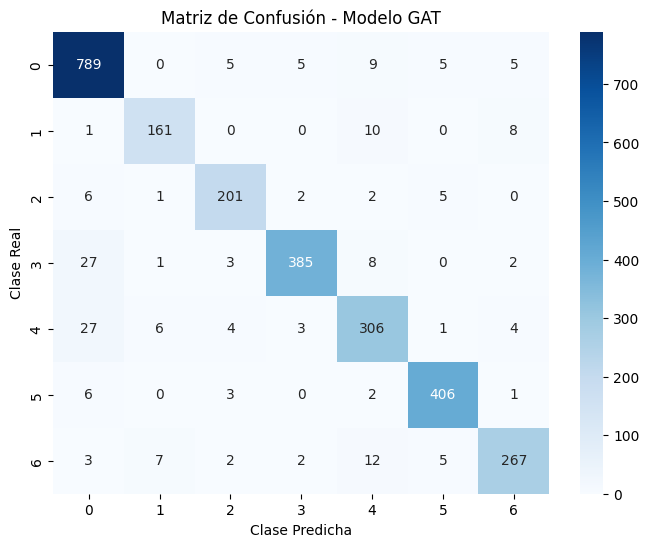


Reporte de Clasificación (GAT):
              precision    recall  f1-score   support

           0       0.92      0.96      0.94       818
           1       0.91      0.89      0.90       180
           2       0.92      0.93      0.92       217
           3       0.97      0.90      0.94       426
           4       0.88      0.87      0.87       351
           5       0.96      0.97      0.97       418
           6       0.93      0.90      0.91       298

    accuracy                           0.93      2708
   macro avg       0.93      0.92      0.92      2708
weighted avg       0.93      0.93      0.93      2708



In [31]:
# Entrenamiento del modelo GAT
optimizer_gat = torch.optim.Adam(model_gat.parameters(), lr=0.01, weight_decay=5e-4)
loss_fn = torch.nn.CrossEntropyLoss()
epochs = 200

for epoch in range(epochs):
    model_gat.train()
    optimizer_gat.zero_grad()
    out = model_gat(graph_data.x, graph_data.edge_index)
    loss = loss_fn(out[train_mask], graph_data.y[train_mask])
    loss.backward()
    optimizer_gat.step()
    if epoch % 20 == 0:
        print(f"GAT - Época {epoch}, Pérdida: {loss.item():.4f}")

# Evaluación del modelo GAT en el conjunto de test
model_gat.eval()
with torch.no_grad():
    out = model_gat(graph_data.x, graph_data.edge_index)
    predictions_gat = out[test_mask].argmax(dim=1)
    correct = (predictions_gat == graph_data.y[test_mask]).sum().item()
    accuracy_gat = correct / test_mask.sum().item()
print(f"\nPrecisión del Modelo GAT en Test: {accuracy_gat:.4f}")

# Evaluación completa para generar matriz de confusión y reporte de clasificación
predictions_all_gat = model_gat(graph_data.x, graph_data.edge_index).argmax(dim=1).cpu().numpy()
true_labels = graph_data.y.cpu().numpy()

from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

cm_gat = confusion_matrix(true_labels, predictions_all_gat)
print("\nMatriz de Confusión (GAT):")
print(cm_gat)

plt.figure(figsize=(8,6))
sns.heatmap(cm_gat, annot=True, fmt="d", cmap="Blues")
plt.title("Matriz de Confusión - Modelo GAT")
plt.xlabel("Clase Predicha")
plt.ylabel("Clase Real")
plt.show()

print("\nReporte de Clasificación (GAT):")
print(classification_report(true_labels, predictions_all_gat))


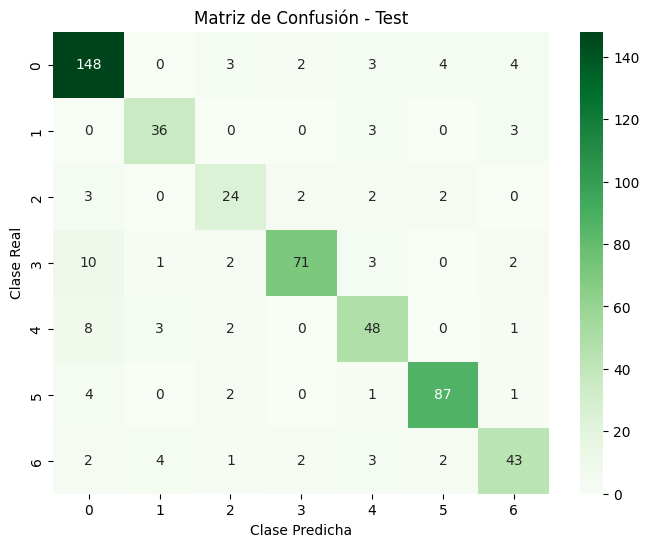

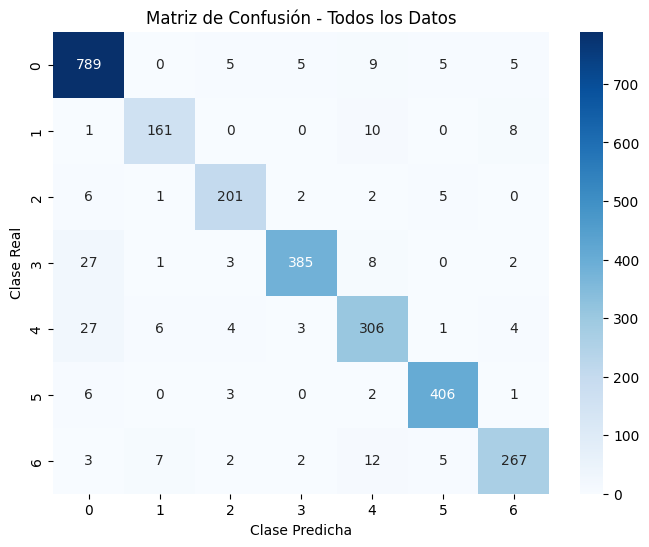

In [32]:
predictions_all_gat = model_gat(graph_data.x, graph_data.edge_index).argmax(dim=1).cpu().numpy()
true_labels = graph_data.y.cpu().numpy()

predictions_test_gat = model_gat(graph_data.x, graph_data.edge_index)[test_mask].argmax(dim=1).cpu().numpy()
true_labels_test = graph_data.y[test_mask].cpu().numpy()

cm_gat = confusion_matrix(true_labels_test, predictions_test_gat)


cm_gat = confusion_matrix(true_labels, predictions_all_gat)


# Matriz de confusión solo en test
cm_test_gat = confusion_matrix(true_labels_test, predictions_test_gat)

plt.figure(figsize=(8,6))
sns.heatmap(cm_test_gat, annot=True, fmt="d", cmap="Greens")
plt.title("Matriz de Confusión - Test")
plt.xlabel("Clase Predicha")
plt.ylabel("Clase Real")
plt.show()

# Matriz de confusión con todos los datos
cm_all_gat = confusion_matrix(true_labels, predictions_all_gat)

plt.figure(figsize=(8,6))
sns.heatmap(cm_all_gat, annot=True, fmt="d", cmap="Blues")
plt.title("Matriz de Confusión - Todos los Datos")
plt.xlabel("Clase Predicha")
plt.ylabel("Clase Real")
plt.show()


## 3.2. Entrenamiento y Evaluación del Modelo GraphSAGE

GraphSAGE - Época 0, Pérdida: 1.9694
GraphSAGE - Época 20, Pérdida: 0.4408
GraphSAGE - Época 40, Pérdida: 0.2027
GraphSAGE - Época 60, Pérdida: 0.1487
GraphSAGE - Época 80, Pérdida: 0.1312
GraphSAGE - Época 100, Pérdida: 0.1200
GraphSAGE - Época 120, Pérdida: 0.1072
GraphSAGE - Época 140, Pérdida: 0.1053
GraphSAGE - Época 160, Pérdida: 0.1010
GraphSAGE - Época 180, Pérdida: 0.0926

Precisión del Modelo GraphSAGE en Test: 0.8450

Matriz de Confusión (GraphSAGE):
[[802   1   3   2   5   3   2]
 [  0 175   0   0   3   0   2]
 [  4   0 206   2   3   1   1]
 [ 11   1   2 406   3   0   3]
 [  9   1   2   0 339   0   0]
 [  3   1   3   1   0 410   0]
 [  2   3   1   2   4   1 285]]


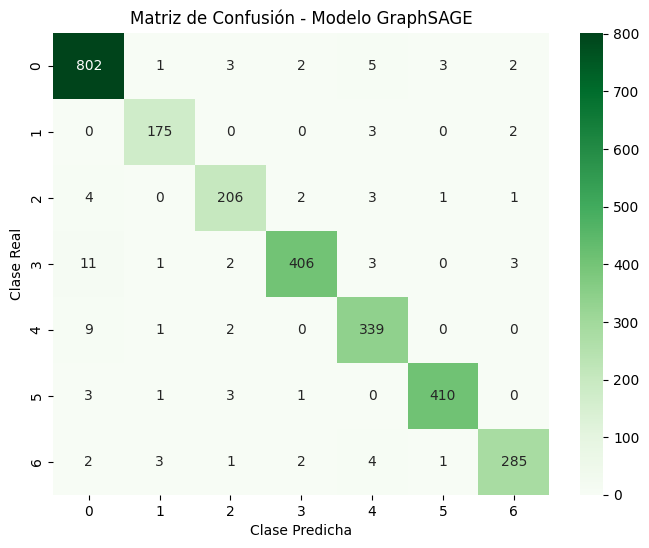


Reporte de Clasificación (GraphSAGE):
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       818
           1       0.96      0.97      0.97       180
           2       0.95      0.95      0.95       217
           3       0.98      0.95      0.97       426
           4       0.95      0.97      0.96       351
           5       0.99      0.98      0.98       418
           6       0.97      0.96      0.96       298

    accuracy                           0.97      2708
   macro avg       0.97      0.97      0.97      2708
weighted avg       0.97      0.97      0.97      2708



In [33]:
# Entrenamiento del modelo GraphSAGE
optimizer_sage = torch.optim.Adam(model_sage.parameters(), lr=0.01, weight_decay=5e-4)
loss_fn = torch.nn.CrossEntropyLoss()
epochs = 200

for epoch in range(epochs):
    model_sage.train()
    optimizer_sage.zero_grad()
    out = model_sage(graph_data.x, graph_data.edge_index)
    loss = loss_fn(out[train_mask], graph_data.y[train_mask])
    loss.backward()
    optimizer_sage.step()
    if epoch % 20 == 0:
        print(f"GraphSAGE - Época {epoch}, Pérdida: {loss.item():.4f}")

# Evaluación del modelo GraphSAGE en el conjunto de test
model_sage.eval()
with torch.no_grad():
    out = model_sage(graph_data.x, graph_data.edge_index)
    predictions_sage = out[test_mask].argmax(dim=1)
    correct = (predictions_sage == graph_data.y[test_mask]).sum().item()
    accuracy_sage = correct / test_mask.sum().item()
print(f"\nPrecisión del Modelo GraphSAGE en Test: {accuracy_sage:.4f}")

# Evaluación completa para generar matriz de confusión y reporte de clasificación
predictions_all_sage = model_sage(graph_data.x, graph_data.edge_index).argmax(dim=1).cpu().numpy()

cm_sage = confusion_matrix(true_labels, predictions_all_sage)
print("\nMatriz de Confusión (GraphSAGE):")
print(cm_sage)

plt.figure(figsize=(8,6))
sns.heatmap(cm_sage, annot=True, fmt="d", cmap="Greens")
plt.title("Matriz de Confusión - Modelo GraphSAGE")
plt.xlabel("Clase Predicha")
plt.ylabel("Clase Real")
plt.show()

print("\nReporte de Clasificación (GraphSAGE):")
print(classification_report(true_labels, predictions_all_sage))


# Análisis de Sensibilidad y Grid Search para GCN

A continuación, presento el código que implementa un análisis de sensibilidad sobre tres hiperparámetros clave para el modelo GCN en el dataset Cora:

- **Número de Capas:** Se evalúan modelos con 2 y 3 capas de convolución.
- **Tamaño de la Capa Oculta:** Se prueban tamaños de 16, 32 y 64 unidades.
- **Proporción de Nodos para Entrenamiento:** Se experimenta con distintos porcentajes (50%, 60% y 80%) para definir la máscara de entrenamiento y test.

Utilizo un grid search para evaluar todas las combinaciones. El modelo se entrena durante 200 épocas con cada configuración y se mide la precisión en el conjunto de test. Finalmente, se identifica la configuración con mayor precisión.

Este análisis me permite entender cómo cada parámetro afecta el desempeño del modelo GCN en Cora.


In [94]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.data import Data
import pandas as pd
import numpy as np
import itertools

# ----------------------------
# 1. Cargar los datos desde cora.content y cora.cites
# ----------------------------

# Cargar el archivo cora.content
archivo_content = "data/cora.content"
data_content = pd.read_csv(archivo_content, sep="\t", header=None)

# Extraer los IDs, features y etiquetas:
# - La primera columna contiene los IDs
# - Las columnas 1:-1 contienen el vector bag-of-words (1433 dimensiones)
# - La última columna contiene la etiqueta (categoría)
paper_ids = data_content.iloc[:, 0].values
features_np = data_content.iloc[:, 1:-1].values.astype(np.float32)  # Shape: (2708, 1433)
labels_cat, uniques = pd.factorize(data_content.iloc[:, -1])
num_classes = len(uniques)

# Convertir features y etiquetas a tensores de PyTorch
features_tensor = torch.tensor(features_np, dtype=torch.float)
labels_tensor = torch.tensor(labels_cat, dtype=torch.long)

# Cargar el archivo cora.cites
archivo_cites = "data/cora.cites"
data_cites = pd.read_csv(archivo_cites, sep="\t", header=None)

# Crear un diccionario que mapea cada paper_id a su índice correspondiente
paper_id_map = {pid: i for i, pid in enumerate(paper_ids)}

# Convertir las relaciones de citación a índices numéricos
# Cada fila del archivo cora.cites tiene el formato: [source, target]
edges = np.array([(paper_id_map[src], paper_id_map[dst]) for src, dst in data_cites.values])
# Convertir la matriz de aristas a un tensor en formato COO (transpuesto)
edge_index = torch.tensor(edges.T, dtype=torch.long)

# Crear el objeto Data de PyTorch Geometric
data = Data(x=features_tensor, edge_index=edge_index, y=labels_tensor)
num_nodes = data.x.shape[0]
print("Datos cargados:")
print(f" - Número de nodos: {num_nodes}")
print(f" - Dimensión de features: {data.x.shape[1]}")
print(f" - Número de clases: {num_classes}")

# ----------------------------
# 2. Definir el Modelo GCN Flexible
# ----------------------------
class GCNModel(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, num_classes, num_layers=2, dropout=0.5):
        super(GCNModel, self).__init__()
        self.convs = torch.nn.ModuleList()
        if num_layers == 2:
            self.convs.append(GCNConv(input_dim, hidden_dim))
            self.convs.append(GCNConv(hidden_dim, num_classes))
        elif num_layers == 3:
            self.convs.append(GCNConv(input_dim, hidden_dim))
            self.convs.append(GCNConv(hidden_dim, hidden_dim))
            self.convs.append(GCNConv(hidden_dim, num_classes))
        else:
            raise ValueError("num_layers must be 2 or 3")
        self.dropout = dropout

    def forward(self, x, edge_index):
        for i, conv in enumerate(self.convs):
            x = conv(x, edge_index)
            if i < len(self.convs) - 1:  # Activación y dropout en todas las capas excepto la última
                x = F.relu(x)
                x = F.dropout(x, p=self.dropout, training=self.training)
        return F.log_softmax(x, dim=1)

# ----------------------------
# 3. Función de Entrenamiento y Evaluación
# ----------------------------
def train_and_evaluate(model, data, train_mask, test_mask, epochs=200, lr=0.01, weight_decay=5e-4):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    loss_fn = torch.nn.CrossEntropyLoss()
    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        out = model(data.x, data.edge_index)
        loss = loss_fn(out[train_mask], data.y[train_mask])
        loss.backward()
        optimizer.step()
    model.eval()
    out = model(data.x, data.edge_index)
    pred = out.argmax(dim=1)
    accuracy = (pred[test_mask] == data.y[test_mask]).sum().item() / test_mask.sum().item()
    return accuracy

# ----------------------------
# 4. Grid Search para Análisis de Sensibilidad
# ----------------------------
results = {}
# Iterar sobre combinaciones de: número de capas (2 o 3), tamaño de la capa oculta (16, 32, 64)
# y proporción de nodos para entrenamiento (50%, 60%, 80%)
for num_layers, hidden_dim, train_prop in itertools.product([2, 3], [16, 32, 64], [0.5, 0.6, 0.8]):
    train_size = int(train_prop * num_nodes)
    # Definir máscaras: los primeros "train_size" nodos se usan para entrenamiento
    train_mask = torch.zeros(num_nodes, dtype=torch.bool)
    train_mask[:train_size] = True
    test_mask = ~train_mask
    # Instanciar el modelo con la configuración actual
    model = GCNModel(input_dim=data.x.shape[1], hidden_dim=hidden_dim,
                     num_classes=num_classes, num_layers=num_layers, dropout=0.5)
    acc = train_and_evaluate(model, data, train_mask, test_mask, epochs=200, lr=0.01, weight_decay=5e-4)
    results[(num_layers, hidden_dim, train_prop)] = acc
    print(f"num_layers={num_layers}, hidden_dim={hidden_dim}, train_prop={train_prop}, test_acc={acc:.4f}")

# Mostrar la mejor configuración
best_params = max(results, key=results.get)
print("\nMejor configuración:", best_params, "con precisión", results[best_params])


Datos cargados:
 - Número de nodos: 2708
 - Dimensión de features: 1433
 - Número de clases: 7
num_layers=2, hidden_dim=16, train_prop=0.5, test_acc=0.7991
num_layers=2, hidden_dim=16, train_prop=0.6, test_acc=0.7943
num_layers=2, hidden_dim=16, train_prop=0.8, test_acc=0.8210
num_layers=2, hidden_dim=32, train_prop=0.5, test_acc=0.7851
num_layers=2, hidden_dim=32, train_prop=0.6, test_acc=0.7804
num_layers=2, hidden_dim=32, train_prop=0.8, test_acc=0.8192
num_layers=2, hidden_dim=64, train_prop=0.5, test_acc=0.7799
num_layers=2, hidden_dim=64, train_prop=0.6, test_acc=0.7758
num_layers=2, hidden_dim=64, train_prop=0.8, test_acc=0.8137
num_layers=3, hidden_dim=16, train_prop=0.5, test_acc=0.7829
num_layers=3, hidden_dim=16, train_prop=0.6, test_acc=0.7804
num_layers=3, hidden_dim=16, train_prop=0.8, test_acc=0.8321
num_layers=3, hidden_dim=32, train_prop=0.5, test_acc=0.7821
num_layers=3, hidden_dim=32, train_prop=0.6, test_acc=0.7749
num_layers=3, hidden_dim=32, train_prop=0.8, test_a

---

# Clasificación con Redes Neuronales "Normales" (MLP) usando Solo cora.content

Es posible entrenar un modelo de deep learning utilizando únicamente el contenido de los artículos (los features de `cora.content`), sin incorporar la información del grafo de citaciones (`cora.cites`). De esta forma, se entrena un clasificador "normal" (por ejemplo, un MLP) que toma la representación de bolsa de palabras de cada artículo y predice su categoría.

Este enfoque sirve como línea base para comparar con modelos que, a su vez, incorporen la estructura del grafo (GNN, GCN, etc.). Cabe destacar que el MLP se entrena de forma independiente para cada nodo, sin aprovechar las relaciones entre ellos.

Aunque existe el `MLPClassifier` en scikit-learn, en este ejemplo se implementará un MLP con TensorFlow/Keras.


# Explicación del Código

1. **Carga del Dataset:**
   - Se carga el archivo `cora.content` y se extraen los IDs, la matriz de características (bag-of-words) y las etiquetas.
   - Las etiquetas se convierten a un formato one-hot, necesario para el entrenamiento con `categorical_crossentropy`.

2. **División del Dataset:**
   - Se divide aleatoriamente el conjunto de datos en dos partes iguales: una para entrenamiento y otra para test.

3. **Definición del Modelo MLP:**
   - Se define un modelo secuencial (MLP) en Keras con dos capas ocultas y Dropout para regularizar el modelo.
   - La capa de salida utiliza activación softmax para predecir la probabilidad de cada clase.

4. **Entrenamiento:**
   - Se entrena el modelo durante 100 épocas con un tamaño de batch de 32 y se utiliza un 10% de los datos de entrenamiento para validación.

5. **Evaluación:**
   - Se evalúa el modelo en el conjunto de test, mostrando la precisión.
   - Se generan la matriz de confusión y el reporte de clasificación para analizar el desempeño por clase.

Este enfoque demuestra que es posible implementar deep learning utilizando una red neuronal "normal" (MLP) con los datos de `cora.content`, sin incorporar la estructura de citaciones. Esto sirve como una línea base para comparar con modelos que integren información de `cora.cites` mediante GNN.


Dataset cora.content cargado:
 - Número de artículos: 2708
 - Número de features: 1433
 - Número de clases: 7


/Users/egoitzaulestiapadilla/opt/anaconda3/lib/python3.9/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │       183,552 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 7)              │           455 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 192,263 (751.03 KB)

 Trainable params: 192,263 (751.03 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.1889 - loss: 1.9402 - val_accuracy: 0.3015 - val_loss: 1.8334
Epoch 2/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.3413 - loss: 1.7397 - val_accuracy: 0.3235 - val_loss: 1.6734
Epoch 3/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4262 - loss: 1.5166 - val_accuracy: 0.5662 - val_loss: 1.4066
Epoch 4/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5848 - loss: 1.2306 - val_accuracy: 0.7059 - val_loss: 1.1254
Epoch 5/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7185 - loss: 0.9115 - val_accuracy: 0.7059 - val_loss: 0.9386
Epoch 6/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8017 - loss: 0.6661 - val_accuracy: 0.7132 - val_loss: 0.8491
Epoch 7/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8613 - loss: 0.5208 - val_accuracy: 0.7426 - val_loss: 0.7888
Epoch 8/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8880 - loss: 0.3902 - val_accuracy: 0.7426 - 

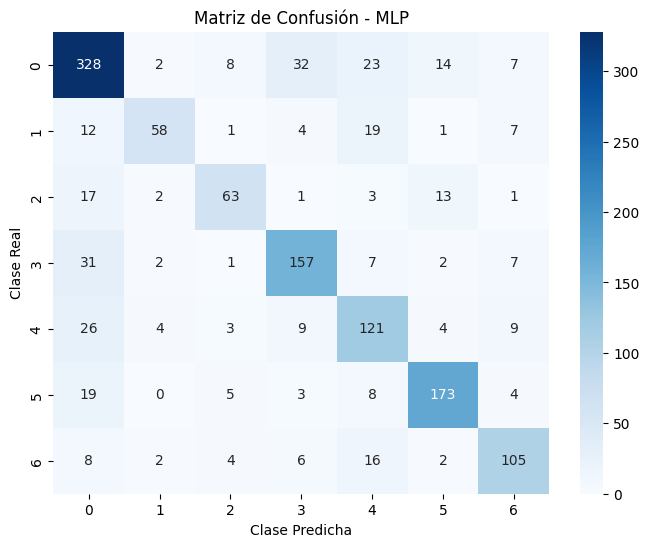


Reporte de Clasificación (MLP):
              precision    recall  f1-score   support

           0       0.74      0.79      0.77       414
           1       0.83      0.57      0.67       102
           2       0.74      0.63      0.68       100
           3       0.74      0.76      0.75       207
           4       0.61      0.69      0.65       176
           5       0.83      0.82      0.82       212
           6       0.75      0.73      0.74       143

    accuracy                           0.74      1354
   macro avg       0.75      0.71      0.73      1354
weighted avg       0.75      0.74      0.74      1354



In [42]:
import tensorflow as tf
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------------------------------
# 1. Cargar el dataset cora.content
# -----------------------------------------------------
archivo_content = "data/cora.content"
data_content = pd.read_csv(archivo_content, sep="\t", header=None)

# Extraer IDs, features y etiquetas:
paper_ids = data_content.iloc[:, 0].values
# Las columnas 1:-1 son los features (bag-of-words), y la última columna es la etiqueta
features_np = data_content.iloc[:, 1:-1].values.astype(np.float32)  # (2708, 1433)
labels_cat, uniques = pd.factorize(data_content.iloc[:, -1])
num_classes = len(uniques)

# Convertir etiquetas a one-hot encoding
labels_onehot = tf.keras.utils.to_categorical(labels_cat)

print("Dataset cora.content cargado:")
print(f" - Número de artículos: {features_np.shape[0]}")
print(f" - Número de features: {features_np.shape[1]}")
print(f" - Número de clases: {num_classes}")

# -----------------------------------------------------
# 2. Dividir el dataset en entrenamiento y test
# -----------------------------------------------------
# Por ejemplo, usar 50% de los artículos para entrenamiento y 50% para test
num_nodes = features_np.shape[0]
indices = np.arange(num_nodes)
np.random.shuffle(indices)
split = num_nodes // 2

train_idx = indices[:split]
test_idx = indices[split:]

X_train = features_np[train_idx]
X_test = features_np[test_idx]
y_train = labels_onehot[train_idx]
y_test = labels_onehot[test_idx]

# -----------------------------------------------------
# 3. Definir el Modelo MLP (clasificador de red neuronal normal)
# -----------------------------------------------------
model_mlp = Sequential([
    Dense(128, activation='relu', input_shape=(features_np.shape[1],)),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model_mlp.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

model_mlp.summary()

# -----------------------------------------------------
# 4. Entrenar el Modelo MLP
# -----------------------------------------------------
history = model_mlp.fit(X_train, y_train,
                        epochs=100,
                        batch_size=32,
                        validation_split=0.1,
                        verbose=1)

# -----------------------------------------------------
# 5. Evaluar el Modelo MLP
# -----------------------------------------------------
test_loss, test_acc = model_mlp.evaluate(X_test, y_test, verbose=0)
print("\nPrecisión en Test (MLP):", test_acc)

# Predicciones y evaluación detallada
y_pred_probs = model_mlp.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test, axis=1)

cm = confusion_matrix(y_true, y_pred)
print("\nMatriz de Confusión (MLP):")
print(cm)

plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Matriz de Confusión - MLP")
plt.xlabel("Clase Predicha")
plt.ylabel("Clase Real")
plt.show()

print("\nReporte de Clasificación (MLP):")
print(classification_report(y_true, y_pred))


Dataset cora.content cargado:
 - Número de artículos: 2708
 - Número de features: 1433
 - Número de clases: 7
Fold 1
  Precisión en Test: 0.7786
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
  Matriz de Confusión:
[[141   1   3   9   8   3   7]
 [  5  20   0   2   9   1   2]
 [  2   0  34   0   0   3   0]
 [ 13   0   3  66   3   0   1]
 [  5   1   2   3  49   3   2]
 [  1   0   3   4   2  70   0]
 [  5   2   2   3   6   1  42]]


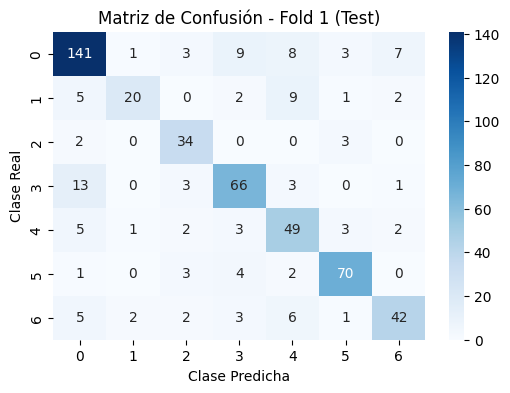

  Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.82      0.82      0.82       172
           1       0.83      0.51      0.63        39
           2       0.72      0.87      0.79        39
           3       0.76      0.77      0.76        86
           4       0.64      0.75      0.69        65
           5       0.86      0.88      0.87        80
           6       0.78      0.69      0.73        61

    accuracy                           0.78       542
   macro avg       0.77      0.76      0.76       542
weighted avg       0.78      0.78      0.78       542


--------------------------------------------------

Fold 2
  Precisión en Test: 0.7454
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
  Matriz de Confusión:
[[136   3   2  11  12   5   1]
 [  2  24   0   2   3   1   1]
 [  5   0  27   1   3   1   0]
 [ 14   1   0  60   8   0   0]
 [ 14   3   2   4  48   0   3]
 [  4   1   2   0   1  73   2]
 [ 10   3   3   2   3   5  36]]


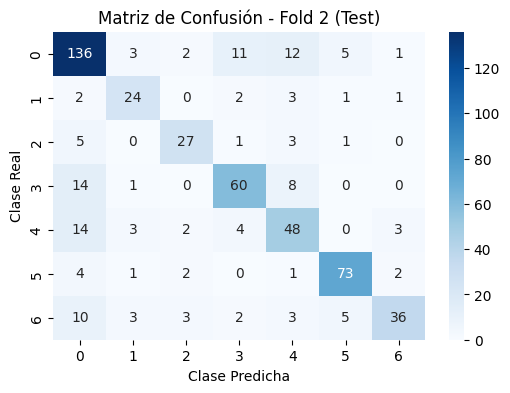

  Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.74      0.80      0.77       170
           1       0.69      0.73      0.71        33
           2       0.75      0.73      0.74        37
           3       0.75      0.72      0.74        83
           4       0.62      0.65      0.63        74
           5       0.86      0.88      0.87        83
           6       0.84      0.58      0.69        62

    accuracy                           0.75       542
   macro avg       0.75      0.73      0.73       542
weighted avg       0.75      0.75      0.74       542


--------------------------------------------------

Fold 3
  Precisión en Test: 0.7601
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
  Matriz de Confusión:
[[139   0   1  10   6   2   3]
 [  4  22   0   0   4   2   1]
 [  5   2  32   1   1   1   2]
 [ 14   3   0  68   4   0   3]
 [ 11   1   1  12  34   3   4]
 [  5   1   5   1   2  68   0]
 [  6   1   0   1   4   3  49]]


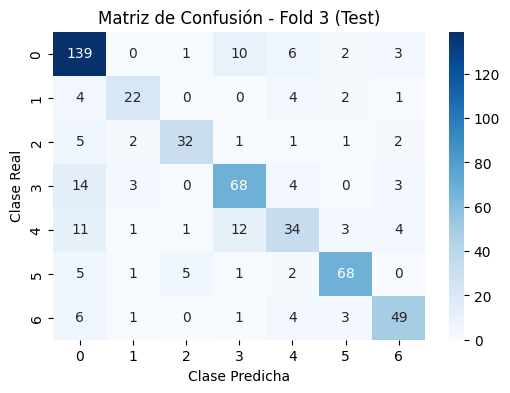

  Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.76      0.86      0.81       161
           1       0.73      0.67      0.70        33
           2       0.82      0.73      0.77        44
           3       0.73      0.74      0.74        92
           4       0.62      0.52      0.56        66
           5       0.86      0.83      0.84        82
           6       0.79      0.77      0.78        64

    accuracy                           0.76       542
   macro avg       0.76      0.73      0.74       542
weighted avg       0.76      0.76      0.76       542


--------------------------------------------------

Fold 4
  Precisión en Test: 0.7819
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
  Matriz de Confusión:
[[135   0   6  10   4   3   4]
 [  3  21   1   3   2   0   3]
 [  4   0  31   1   3   1   2]
 [  9   0   2  82   0   0   4]
 [ 13   5   2   5  46   0   4]
 [  2   3   6   0   3  66   3]
 [  1   0   1   2   1   2  42]]


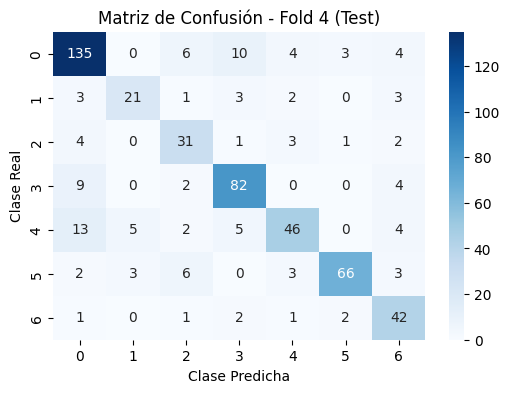

  Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.81      0.83      0.82       162
           1       0.72      0.64      0.68        33
           2       0.63      0.74      0.68        42
           3       0.80      0.85      0.82        97
           4       0.78      0.61      0.69        75
           5       0.92      0.80      0.85        83
           6       0.68      0.86      0.76        49

    accuracy                           0.78       541
   macro avg       0.76      0.76      0.76       541
weighted avg       0.79      0.78      0.78       541


--------------------------------------------------

Fold 5
  Precisión en Test: 0.7689
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
  Matriz de Confusión:
[[126   1   2  10   7   5   2]
 [  5  26   2   1   2   1   5]
 [  6   1  38   5   2   2   1]
 [ 13   2   0  47   3   1   2]
 [  9   4   2   1  52   2   1]
 [  4   1   0   1   2  82   0]
 [  3   2   1   1   7   3  45]]


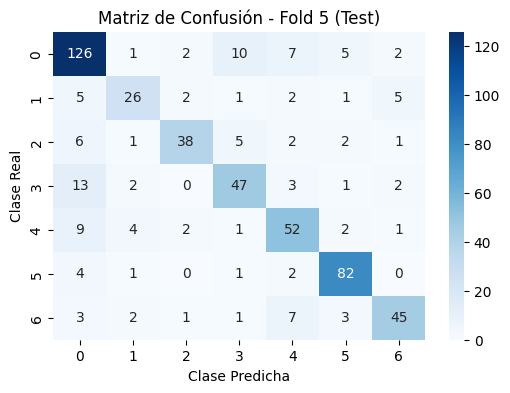

  Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.76      0.82      0.79       153
           1       0.70      0.62      0.66        42
           2       0.84      0.69      0.76        55
           3       0.71      0.69      0.70        68
           4       0.69      0.73      0.71        71
           5       0.85      0.91      0.88        90
           6       0.80      0.73      0.76        62

    accuracy                           0.77       541
   macro avg       0.77      0.74      0.75       541
weighted avg       0.77      0.77      0.77       541


--------------------------------------------------


Precisión Promedio en Test (Validación Cruzada): 0.7670 ± 0.0132


In [35]:
import tensorflow as tf
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import KFold

# -----------------------------------------------------
# 1. Cargar el dataset cora.content
# -----------------------------------------------------
archivo_content = "data/cora.content"
data_content = pd.read_csv(archivo_content, sep="\t", header=None)

# Extraer IDs, features y etiquetas
paper_ids = data_content.iloc[:, 0].values
# Las columnas 1:-1 son los features (bag-of-words), y la última columna es la etiqueta
features_np = data_content.iloc[:, 1:-1].values.astype(np.float32)  # (2708, 1433)
labels_cat, uniques = pd.factorize(data_content.iloc[:, -1])
num_classes = len(uniques)

# Convertir etiquetas a one-hot encoding
labels_onehot = tf.keras.utils.to_categorical(labels_cat)

print("Dataset cora.content cargado:")
print(f" - Número de artículos: {features_np.shape[0]}")
print(f" - Número de features: {features_np.shape[1]}")
print(f" - Número de clases: {num_classes}")

# -----------------------------------------------------
# 2. Validación Cruzada (K-Fold)
# -----------------------------------------------------
kf = KFold(n_splits=5, shuffle=True, random_state=42)
fold_accuracies = []
fold_idx = 1

for train_index, test_index in kf.split(features_np):
    print(f"Fold {fold_idx}")
    X_train = features_np[train_index]
    X_test = features_np[test_index]
    y_train = labels_onehot[train_index]
    y_test = labels_onehot[test_index]
    
    # -----------------------------------------------------
    # 3. Definir el Modelo MLP (clasificador)
    # -----------------------------------------------------
    model_mlp = Sequential([
        Dense(128, activation='relu', input_shape=(features_np.shape[1],)),
        Dropout(0.5),
        Dense(64, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    
    model_mlp.compile(optimizer=Adam(learning_rate=1e-3),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
    
    # -----------------------------------------------------
    # 4. Entrenar el Modelo MLP
    # -----------------------------------------------------
    history = model_mlp.fit(X_train, y_train,
                            epochs=100,
                            batch_size=32,
                            validation_split=0.1,
                            verbose=0)
    
    # -----------------------------------------------------
    # 5. Evaluar el Modelo MLP en el conjunto de Test
    # -----------------------------------------------------
    test_loss, test_acc = model_mlp.evaluate(X_test, y_test, verbose=0)
    fold_accuracies.append(test_acc)
    print(f"  Precisión en Test: {test_acc:.4f}")
    
    # Obtener predicciones y generar la matriz de confusión para el conjunto de Test
    y_pred_probs = model_mlp.predict(X_test)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = np.argmax(y_test, axis=1)
    
    cm = confusion_matrix(y_true, y_pred)
    print("  Matriz de Confusión:")
    print(cm)
    plt.figure(figsize=(6,4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title(f"Matriz de Confusión - Fold {fold_idx} (Test)")
    plt.xlabel("Clase Predicha")
    plt.ylabel("Clase Real")
    plt.show()
    
    print("  Reporte de Clasificación:")
    print(classification_report(y_true, y_pred))
    print("\n" + "-"*50 + "\n")
    fold_idx += 1

avg_acc = np.mean(fold_accuracies)
std_acc = np.std(fold_accuracies)
print(f"\nPrecisión Promedio en Test (Validación Cruzada): {avg_acc:.4f} ± {std_acc:.4f}")


2025-02-05 18:57:40.184011: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Dimensiones de extended_features: (2708, 1436)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │       183,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 7)              │           455 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 192,647 (752.53 KB)

 Trainable params: 192,647 (752.53 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.1903 - loss: 1.9216 - val_accuracy: 0.2941 - val_loss: 1.7660
Epoch 2/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.3168 - loss: 1.7267 - val_accuracy: 0.3456 - val_loss: 1.5711
Epoch 3/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4561 - loss: 1.4858 - val_accuracy: 0.5662 - val_loss: 1.3093
Epoch 4/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6271 - loss: 1.1516 - val_accuracy: 0.6618 - val_loss: 1.0516
Epoch 5/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7163 - loss: 0.8903 - val_accuracy: 0.6985 - val_loss: 0.9403
Epoch 6/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8023 - loss: 0.6284 - val_accuracy: 0.7132 - val_loss: 0.8959
Epoch 7/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8281 - loss: 0.5340 - val_accuracy: 0.7500 - val_loss: 0.8835
Epoch 8/100
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8822 - loss: 0.3850 - val_accuracy: 0.7574 - 

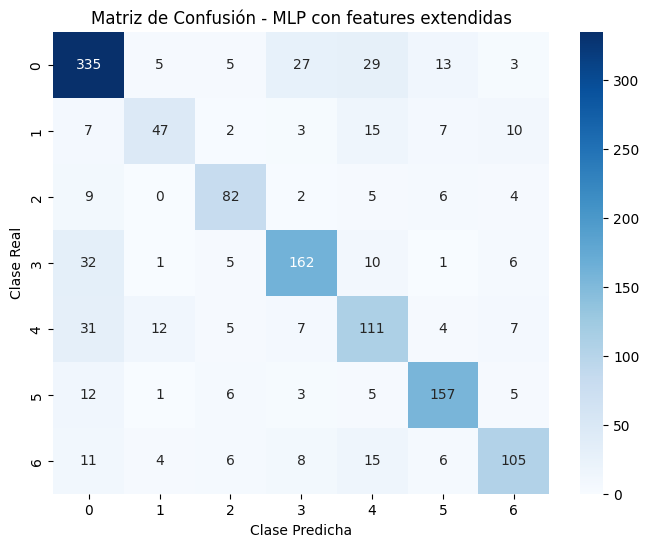


Reporte de Clasificación (MLP con features extendidas):
              precision    recall  f1-score   support

           0       0.77      0.80      0.78       417
           1       0.67      0.52      0.58        91
           2       0.74      0.76      0.75       108
           3       0.76      0.75      0.76       217
           4       0.58      0.63      0.60       177
           5       0.81      0.83      0.82       189
           6       0.75      0.68      0.71       155

    accuracy                           0.74      1354
   macro avg       0.73      0.71      0.72      1354
weighted avg       0.74      0.74      0.74      1354



In [34]:
import pandas as pd
import numpy as np
import networkx as nx
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# ----------------------------
# 1. Cargar el dataset cora.content
# ----------------------------
archivo_content = "data/cora.content"
data_content = pd.read_csv(archivo_content, sep="\t", header=None)

# Extraer IDs, features y etiquetas
paper_ids = data_content.iloc[:, 0].values
# Las columnas 1:-1 contienen el vector bag-of-words (features)
features = data_content.iloc[:, 1:-1].values.astype(np.float32)  # Shape: (2708, 1433)
labels_cat, uniques = pd.factorize(data_content.iloc[:, -1])
num_classes = len(uniques)

# ----------------------------
# 2. Cargar el dataset cora.cites y construir el grafo
# ----------------------------
archivo_cites = "data/cora.cites"
data_cites = pd.read_csv(archivo_cites, sep="\t", header=None)

# Crear un grafo dirigido utilizando NetworkX
G = nx.DiGraph()
G.add_edges_from(data_cites.values)

# Convertir el grafo a no dirigido para calcular el coeficiente de agrupamiento
G_undirected = G.to_undirected()

# ----------------------------
# 3. Calcular características del grafo para cada nodo
# ----------------------------
# Para cada artículo (identificado por su paper_id), calculamos:
# - Grado de entrada (in-degree)
# - Grado de salida (out-degree)
# - Coeficiente de agrupamiento (clustering coefficient)
in_degrees = []
out_degrees = []
clustering_coeffs = []

for pid in paper_ids:
    # Si el nodo no existe en el grafo (rara vez, pero se controla), se asigna 0.
    in_deg = G.in_degree(pid) if pid in G.nodes() else 0
    out_deg = G.out_degree(pid) if pid in G.nodes() else 0
    cluster = nx.clustering(G_undirected, pid) if pid in G_undirected.nodes() else 0.0
    in_degrees.append(in_deg)
    out_degrees.append(out_deg)
    clustering_coeffs.append(cluster)

# Convertir listas a arrays (con forma [num_nodos, 1])
in_degrees = np.array(in_degrees, dtype=np.float32).reshape(-1, 1)
out_degrees = np.array(out_degrees, dtype=np.float32).reshape(-1, 1)
clustering_coeffs = np.array(clustering_coeffs, dtype=np.float32).reshape(-1, 1)

# Función para normalizar (min-max normalization)
def min_max_norm(arr):
    return (arr - arr.min()) / (arr.max() - arr.min() + 1e-8)

in_degrees_norm = min_max_norm(in_degrees)
out_degrees_norm = min_max_norm(out_degrees)
clustering_coeffs_norm = min_max_norm(clustering_coeffs)

# ----------------------------
# 4. Concatenar las características originales con las métricas del grafo
# ----------------------------
# Se añaden tres columnas nuevas a los features originales
extended_features = np.concatenate([features, in_degrees_norm, out_degrees_norm, clustering_coeffs_norm], axis=1)
print("Dimensiones de extended_features:", extended_features.shape)
# Resultado esperado: (2708, 1433 + 3) = (2708, 1436)

# Convertir etiquetas a one-hot encoding
labels_onehot = tf.keras.utils.to_categorical(labels_cat, num_classes=num_classes)

# ----------------------------
# 5. Dividir el dataset en entrenamiento y test
# ----------------------------
num_nodes = extended_features.shape[0]
indices = np.arange(num_nodes)
np.random.shuffle(indices)
split = num_nodes // 2

train_idx = indices[:split]
test_idx = indices[split:]

X_train = extended_features[train_idx]
X_test = extended_features[test_idx]
y_train = labels_onehot[train_idx]
y_test = labels_onehot[test_idx]

# ----------------------------
# 6. Definir y entrenar el modelo MLP
# ----------------------------
model_mlp = Sequential([
    Dense(128, activation='relu', input_shape=(extended_features.shape[1],)),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model_mlp.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

model_mlp.summary()

history = model_mlp.fit(X_train, y_train,
                        epochs=100,
                        batch_size=32,
                        validation_split=0.1,
                        verbose=1)

# ----------------------------
# 7. Evaluar el modelo MLP
# ----------------------------
test_loss, test_acc = model_mlp.evaluate(X_test, y_test, verbose=0)
print("\nPrecisión en Test (MLP con features extendidas):", test_acc)

# Predicciones y evaluación detallada
y_pred_probs = model_mlp.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test, axis=1)

cm = confusion_matrix(y_true, y_pred)
print("\nMatriz de Confusión (MLP con features extendidas):")
print(cm)

plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Matriz de Confusión - MLP con features extendidas")
plt.xlabel("Clase Predicha")
plt.ylabel("Clase Real")
plt.show()

print("\nReporte de Clasificación (MLP con features extendidas):")
print(classification_report(y_true, y_pred))


---

# **FASE FINAL DEL PROYECTO**

---

# Comparación de Modelos Finales

Dimensiones de extended_features: (2708, 1436)

=== Validación Cruzada MLP (Features Extendidas) ===

Fold 1
  Precisión en Test: 0.7786
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

Fold 2
  Precisión en Test: 0.7565
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

Fold 3
  Precisión en Test: 0.7417
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

Fold 4
  Precisión en Test: 0.7874
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

Fold 5
  Precisión en Test: 0.7819
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

Matriz de Confusión Agregada (MLP - Test):
[[679   5  11  55  32  21  15]
 [ 15 111   4   7  23   5  15]
 [ 24   3 158   5  11  11   5]
 [ 60   7   4 322  21   0  12]
 [ 53  13   8  17 233  10  17]
 [ 19   7  10   5   8 361   8]
 [ 18  12   3  11  27   8 219]]


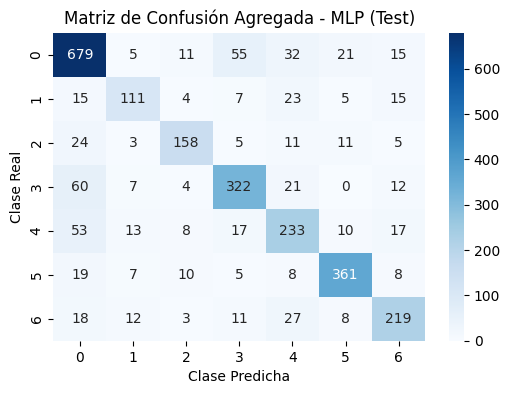


Reporte de Clasificación (MLP - Test):
              precision    recall  f1-score   support

           0       0.78      0.83      0.81       818
           1       0.70      0.62      0.66       180
           2       0.80      0.73      0.76       217
           3       0.76      0.76      0.76       426
           4       0.66      0.66      0.66       351
           5       0.87      0.86      0.87       418
           6       0.75      0.73      0.74       298

    accuracy                           0.77      2708
   macro avg       0.76      0.74      0.75      2708
weighted avg       0.77      0.77      0.77      2708


Precisión Promedio MLP (CV): 0.7692 ± 0.0173

Datos para GNN cargados:
 - Número de nodos: 2708
 - Dimensión de features: 1433
 - Número de clases: 7

=== Validación Cruzada para Modelos GNN ===

Modelo: GCN
  Fold 1: 0.8432
  Fold 2: 0.8210
  Fold 3: 0.8321
  Fold 4: 0.8614
  Fold 5: 0.8410
  Precisión Promedio GCN: 0.8397 ± 0.0133

Modelo: GAT
  Fold 1: 0.87

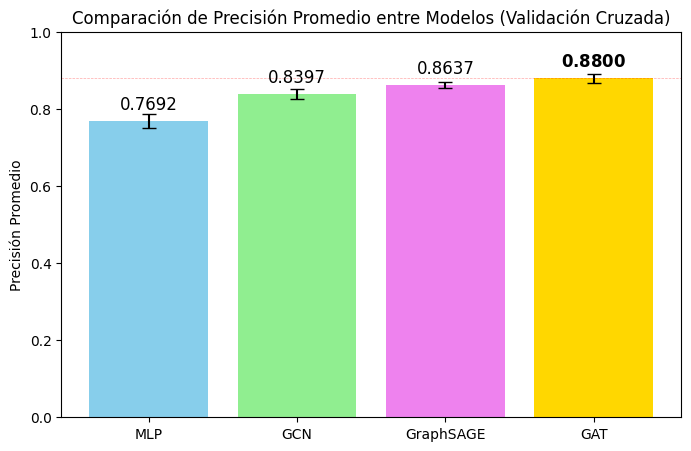


=== Matrices de Confusión para Modelos GNN (Último Fold - Test) ===

Matriz de Confusión (GCN - Último Fold Test):
[[132   0   4   4   8   5   0]
 [  0  33   0   0   4   1   4]
 [  6   0  43   0   3   2   1]
 [  3   0   0  57   6   0   2]
 [  3   5   1   1  60   1   0]
 [  2   0   3   0   2  83   0]
 [  3   0   2   0   6   4  47]]


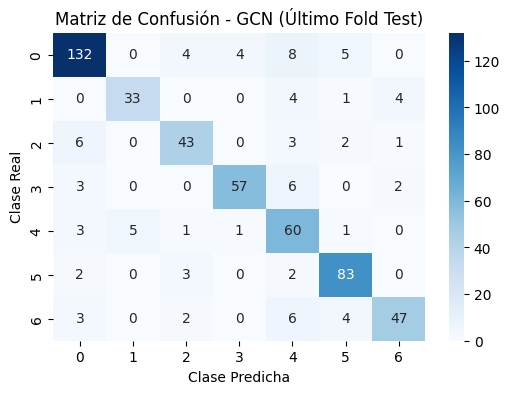


Matriz de Confusión (GAT - Último Fold Test):
[[141   0   2   1   5   4   0]
 [  0  37   0   0   3   0   2]
 [  2   0  46   0   3   4   0]
 [  3   0   0  59   5   0   1]
 [  4   2   0   1  64   0   0]
 [  2   0   0   0   2  86   0]
 [  3   0   1   0   4   3  51]]


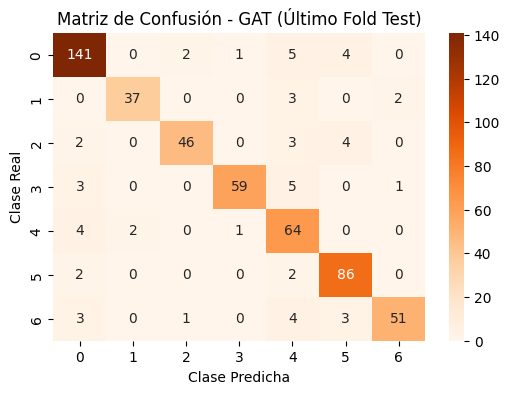


Matriz de Confusión (GraphSAGE - Último Fold Test):
[[143   0   1   2   5   2   0]
 [  1  36   0   0   2   1   2]
 [  6   0  42   0   4   3   0]
 [  4   0   0  59   5   0   0]
 [  7   3   0   1  60   0   0]
 [  2   0   1   0   2  85   0]
 [  4   0   1   0   6   2  49]]


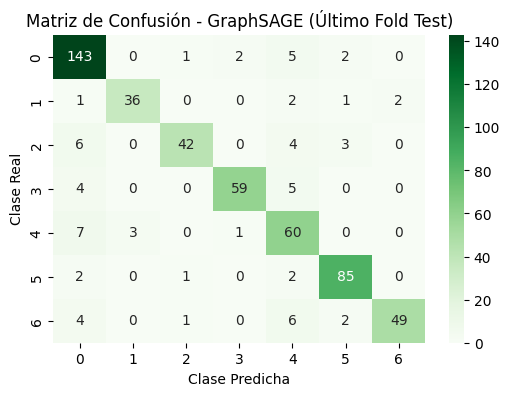


Conclusión Final:
El modelo final con la mayor precisión en test es: GAT con una precisión promedio de 0.8800


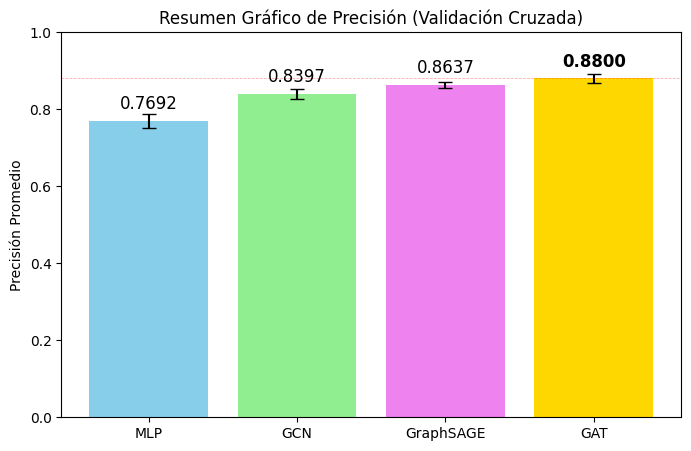

In [2]:
##############################################
# Comparación de Modelos
# SECCIÓN A: Modelo Baseline con MLP (Features Extendidas)
# SECCIÓN B: Modelos GNN (GCN, GAT y GraphSAGE) usando PyTorch Geometric
# SECCIÓN C: Resumen Final y Comparación
# SECCIÓN D: Visualización Comparativa de Precisión
# SECCIÓN E: Conclusión Final
##############################################

import warnings
warnings.filterwarnings("ignore")

##############################################
# SECCIÓN A: MLP Baseline con Features Extendidas
##############################################
import pandas as pd
import numpy as np
import networkx as nx
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import KFold

# A.1. Cargar y Preprocesar los Datos (cora.content y cora.cites)
archivo_content = "data/cora.content"
data_content = pd.read_csv(archivo_content, sep="\t", header=None)

# Extraer IDs, features y etiquetas
paper_ids = data_content.iloc[:, 0].values
features = data_content.iloc[:, 1:-1].values.astype(np.float32)  # (2708, 1433)
labels_cat, uniques = pd.factorize(data_content.iloc[:, -1])
num_classes = len(uniques)

# Cargar cora.cites y construir el grafo
archivo_cites = "data/cora.cites"
data_cites = pd.read_csv(archivo_cites, sep="\t", header=None)
G = nx.DiGraph()
G.add_edges_from(data_cites.values)
G_undirected = G.to_undirected()

# Calcular métricas del grafo: in-degree, out-degree, clustering coefficient
in_degrees = []
out_degrees = []
clustering_coeffs = []
for pid in paper_ids:
    in_deg = G.in_degree(pid) if pid in G.nodes() else 0
    out_deg = G.out_degree(pid) if pid in G.nodes() else 0
    cluster = nx.clustering(G_undirected, pid) if pid in G_undirected.nodes() else 0.0
    in_degrees.append(in_deg)
    out_degrees.append(out_deg)
    clustering_coeffs.append(cluster)

in_degrees = np.array(in_degrees, dtype=np.float32).reshape(-1, 1)
out_degrees = np.array(out_degrees, dtype=np.float32).reshape(-1, 1)
clustering_coeffs = np.array(clustering_coeffs, dtype=np.float32).reshape(-1, 1)

def min_max_norm(arr):
    return (arr - arr.min()) / (arr.max() - arr.min() + 1e-8)

in_degrees_norm = min_max_norm(in_degrees)
out_degrees_norm = min_max_norm(out_degrees)
clustering_coeffs_norm = min_max_norm(clustering_coeffs)

# Extender las features originales con las métricas normalizadas
extended_features = np.concatenate([features, in_degrees_norm, out_degrees_norm, clustering_coeffs_norm], axis=1)
print("Dimensiones de extended_features:", extended_features.shape)  # (2708, 1436)

# Convertir etiquetas a one-hot encoding
labels_onehot = tf.keras.utils.to_categorical(labels_cat, num_classes=num_classes)

# A.2. Validación Cruzada para el Modelo MLP (Features Extendidas)
kf = KFold(n_splits=5, shuffle=True, random_state=42)
mlp_fold_accuracies = []
all_y_true = []  # Almacenar etiquetas de test de todos los folds
all_y_pred = []  # Almacenar predicciones de test de todos los folds
fold_idx = 1

print("\n=== Validación Cruzada MLP (Features Extendidas) ===")
for train_index, test_index in kf.split(extended_features):
    print(f"\nFold {fold_idx}")
    X_train, X_test = extended_features[train_index], extended_features[test_index]
    y_train, y_test = labels_onehot[train_index], labels_onehot[test_index]
    
    # Definir el modelo MLP
    model_mlp = Sequential([
        Dense(128, activation='relu', input_shape=(extended_features.shape[1],)),
        Dropout(0.5),
        Dense(64, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    model_mlp.compile(optimizer=Adam(learning_rate=1e-3),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
    # Entrenar
    model_mlp.fit(X_train, y_train,
                  epochs=100,
                  batch_size=32,
                  validation_split=0.1,
                  verbose=0)
    
    # Evaluar en el conjunto de Test del fold
    test_loss, test_acc = model_mlp.evaluate(X_test, y_test, verbose=0)
    mlp_fold_accuracies.append(test_acc)
    print(f"  Precisión en Test: {test_acc:.4f}")
    
    # Obtener predicciones (solo test) para la matriz de confusión global
    y_pred_probs = model_mlp.predict(X_test)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = np.argmax(y_test, axis=1)
    all_y_true.extend(y_true)
    all_y_pred.extend(y_pred)
    
    fold_idx += 1

# Matriz de confusión agregada para MLP (solo sobre test)
agg_cm_mlp = confusion_matrix(np.array(all_y_true), np.array(all_y_pred))
print("\nMatriz de Confusión Agregada (MLP - Test):")
print(agg_cm_mlp)
plt.figure(figsize=(6,4))
sns.heatmap(agg_cm_mlp, annot=True, fmt="d", cmap="Blues")
plt.title("Matriz de Confusión Agregada - MLP (Test)")
plt.xlabel("Clase Predicha")
plt.ylabel("Clase Real")
plt.show()
print("\nReporte de Clasificación (MLP - Test):")
print(classification_report(np.array(all_y_true), np.array(all_y_pred)))

avg_mlp_acc = np.mean(mlp_fold_accuracies)
std_mlp_acc = np.std(mlp_fold_accuracies)
print(f"\nPrecisión Promedio MLP (CV): {avg_mlp_acc:.4f} ± {std_mlp_acc:.4f}")


##############################################
# SECCIÓN B: Modelos GNN usando PyTorch Geometric
##############################################
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, GATConv, SAGEConv
from torch_geometric.data import Data
from sklearn.model_selection import KFold
import itertools
import time

# B.1. Cargar los datos de cora.content y cora.cites (sin extensión de features)
archivo_content = "data/cora.content"
data_df = pd.read_csv(archivo_content, sep="\t", header=None)
paper_ids = data_df.iloc[:, 0].values
features_torch = torch.tensor(data_df.iloc[:, 1:-1].values, dtype=torch.float)  # (2708, 1433)
labels_np, uniques = pd.factorize(data_df.iloc[:, -1])
labels_torch = torch.tensor(labels_np, dtype=torch.long)
num_classes = len(uniques)

archivo_cites = "data/cora.cites"
edges_df = pd.read_csv(archivo_cites, sep="\t", header=None)
paper_id_map = {pid: i for i, pid in enumerate(paper_ids)}
edges_numeric = np.array([(paper_id_map[src], paper_id_map[dst]) for src, dst in edges_df.values]).T
edge_index = torch.tensor(edges_numeric, dtype=torch.long)

# Crear objeto Data para PyTorch Geometric
graph_data = Data(x=features_torch, edge_index=edge_index, y=labels_torch)
num_nodes = graph_data.x.shape[0]
print("\nDatos para GNN cargados:")
print(f" - Número de nodos: {num_nodes}")
print(f" - Dimensión de features: {graph_data.x.shape[1]}")
print(f" - Número de clases: {num_classes}")

# B.2. Definir Modelos GNN
# B.2.a Modelo GCN
class GCN(torch.nn.Module):
    def __init__(self, num_features, num_classes):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(num_features, 16)
        self.conv2 = GCNConv(16, num_classes)
    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

# B.2.b Modelo GAT
class GAT(torch.nn.Module):
    def __init__(self, num_features, num_classes, hidden_dim=8, heads=8, dropout=0.6):
        super(GAT, self).__init__()
        self.gat1 = GATConv(num_features, hidden_dim, heads=heads, dropout=dropout)
        self.gat2 = GATConv(hidden_dim * heads, num_classes, heads=1, concat=False, dropout=dropout)
        self.dropout = dropout
    def forward(self, x, edge_index):
        x = self.gat1(x, edge_index)
        x = F.elu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.gat2(x, edge_index)
        return F.log_softmax(x, dim=1)

# B.2.c Modelo GraphSAGE
class GraphSAGE(torch.nn.Module):
    def __init__(self, num_features, num_classes, hidden_dim=16, dropout=0.5):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(num_features, hidden_dim)
        self.conv2 = SAGEConv(hidden_dim, num_classes)
        self.dropout = dropout
    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=self.dropout, training=self.training)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

# B.3. Función para Entrenar y Evaluar un Modelo GNN en un Fold
def run_fold_gnn(train_idx, test_idx, data, model_class, epochs=200, lr=0.01, weight_decay=5e-4):
    num_nodes = data.x.shape[0]
    train_mask = torch.zeros(num_nodes, dtype=torch.bool)
    test_mask = torch.zeros(num_nodes, dtype=torch.bool)
    train_mask[train_idx] = True
    test_mask[test_idx] = True
    model = model_class(num_features=data.x.shape[1], num_classes=num_classes)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    loss_fn = torch.nn.CrossEntropyLoss()
    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        out = model(data.x, data.edge_index)
        loss = loss_fn(out[train_mask], data.y[train_mask])
        loss.backward()
        optimizer.step()
    model.eval()
    with torch.no_grad():
        out = model(data.x, data.edge_index)
        pred = out.argmax(dim=1)
        accuracy = (pred[test_mask] == data.y[test_mask]).sum().item() / test_mask.sum().item()
    return accuracy, model, train_mask, test_mask

# B.4. Validación Cruzada para Modelos GNN y Obtener Matrices de Confusión del Último Fold
from sklearn.model_selection import KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)
gnn_models = {'GCN': GCN, 'GAT': GAT, 'GraphSAGE': GraphSAGE}
results_gnn = {key: [] for key in gnn_models.keys()}
conf_matrices = {}  # Almacenar la matriz de confusión del último fold de cada modelo

print("\n=== Validación Cruzada para Modelos GNN ===")
for model_name, model_class in gnn_models.items():
    print(f"\nModelo: {model_name}")
    fold_idx = 1
    last_cm = None
    for train_index, test_index in kf.split(np.arange(num_nodes)):
        acc, model_instance, train_mask_fold, test_mask_fold = run_fold_gnn(train_index, test_index, graph_data, model_class, epochs=200, lr=0.01, weight_decay=5e-4)
        results_gnn[model_name].append(acc)
        print(f"  Fold {fold_idx}: {acc:.4f}")
        # Guardar la matriz de confusión del último fold (fold 5)
        if fold_idx == 5:
            model_instance.eval()
            with torch.no_grad():
                out = model_instance(graph_data.x, graph_data.edge_index)
                pred = out.argmax(dim=1)
            pred_test = pred[test_mask_fold].cpu().numpy()
            true_test = graph_data.y[test_mask_fold].cpu().numpy()
            last_cm = confusion_matrix(true_test, pred_test)
        fold_idx += 1
    conf_matrices[model_name] = last_cm
    avg = np.mean(results_gnn[model_name])
    std = np.std(results_gnn[model_name])
    print(f"  Precisión Promedio {model_name}: {avg:.4f} ± {std:.4f}")

##############################################
# SECCIÓN C: Resumen Final y Comparación de Modelos
##############################################
mlp_avg = np.mean(mlp_fold_accuracies)
mlp_std = np.std(mlp_fold_accuracies)

gnn_avg = {model_name: np.mean(results_gnn[model_name]) for model_name in gnn_models.keys()}
gnn_std = {model_name: np.std(results_gnn[model_name]) for model_name in gnn_models.keys()}

all_models_acc = {"MLP": mlp_avg}
all_models_acc.update(gnn_avg)

print("\n=== Resumen de Precisión Promedio (Validación Cruzada) ===")
for model_name, acc in all_models_acc.items():
    std_val = mlp_std if model_name == "MLP" else gnn_std[model_name]
    print(f"{model_name}: {acc:.4f} ± {std_val:.4f}")

##############################################
# SECCIÓN D: Visualización Comparativa de Precisión
##############################################
sorted_models = sorted(all_models_acc.items(), key=lambda x: x[1])
model_names = [item[0] for item in sorted_models]
accuracies = [item[1] for item in sorted_models]
std_devs = [mlp_std if name == "MLP" else gnn_std[name] for name in model_names]

color_dict = {"MLP": "skyblue", "GCN": "lightgreen", "GAT": "gold", "GraphSAGE": "violet"}
colors = [color_dict[name] for name in model_names]

plt.figure(figsize=(8,5))
bars = plt.bar(model_names, accuracies, yerr=std_devs, capsize=5, color=colors)

best_model = max(all_models_acc, key=all_models_acc.get)
best_acc = all_models_acc[best_model]

plt.axhline(y=best_acc, color='red', linestyle='--', linewidth=0.5, alpha=0.34)

for bar, name in zip(bars, model_names):
    text = f"{bar.get_height():.4f}"
    if name == best_model:
        text = r"$\bf{" + text + "}$"
    plt.text(bar.get_x() + bar.get_width()/2.0, bar.get_height() + 0.02, text,
             ha="center", va="bottom", fontsize=12)
    
plt.ylabel("Precisión Promedio")
plt.title("Comparación de Precisión Promedio entre Modelos (Validación Cruzada)")
plt.ylim(0, 1)
plt.show()

##############################################
# SECCIÓN E: Visualización de Matrices de Confusión para Modelos GNN
##############################################
print("\n=== Matrices de Confusión para Modelos GNN (Último Fold - Test) ===")
for model_name, cm in conf_matrices.items():
    print(f"\nMatriz de Confusión ({model_name} - Último Fold Test):")
    print(cm)
    plt.figure(figsize=(6,4))
    cmap = "Blues" if model_name == "GCN" else ("Greens" if model_name == "GraphSAGE" else "Oranges")
    sns.heatmap(cm, annot=True, fmt="d", cmap=cmap)
    plt.title(f"Matriz de Confusión - {model_name} (Último Fold Test)")
    plt.xlabel("Clase Predicha")
    plt.ylabel("Clase Real")
    plt.show()

##############################################
# SECCIÓN F: Conclusión Final
##############################################
print("\nConclusión Final:")
print(f"El modelo final con la mayor precisión en test es: {best_model} con una precisión promedio de {best_acc:.4f}")

##############################################
# SECCIÓN G: Resumen Gráfico de Precisión de Todos los Modelos
##############################################
plt.figure(figsize=(8,5))
plt.bar(model_names, accuracies, yerr=std_devs, capsize=5, color=colors)
plt.axhline(y=best_acc, color='red', linestyle='--', linewidth=0.55, alpha=0.34)
for i, (name, acc) in enumerate(sorted_models):
    plt.text(i, acc + 0.02, f"{acc:.4f}", ha="center", va="bottom", fontsize=12,
             fontweight="bold" if name == best_model else "normal")
plt.ylabel("Precisión Promedio")
plt.title("Resumen Gráfico de Precisión (Validación Cruzada)")
plt.ylim(0, 1)
plt.show()


# Conclusiones Finales

A lo largo de este proyecto he abordado la tarea de clasificar artículos científicos del dataset Cora utilizando distintos enfoques de deep learning. Para ello, he realizado dos líneas de experimentación principales:

- **Modelos GNN usando PyTorch Geometric:**  

  En esta primera aproximación, he explorado tres arquitecturas de redes neuronales de grafos:

  - **GCN:** Ha obtenido una precisión promedio de **0.8397 ± 0.0133**.

  - **GAT:** Ha logrado la mayor precisión, con un promedio de **0.88 ± 0.0122**.

  - **GraphSAGE:** Ha alcanzado una precisión promedio de **0.8637 ± 0.0076**.

- **Modelo Baseline con MLP (Features Extendidas):**  

  Paralelamente, he extendido las características de cada artículo concatenando métricas del grafo (grado de entrada, grado de salida y coeficiente de agrupamiento) a las features originales (bag-of-words). Luego he entrenado un modelo MLP utilizando validación cruzada (5-fold), obteniendo una precisión promedio de aproximadamente **0.7692 ± 0.0173** en el conjunto de test. La matriz de confusión y el reporte de clasificación agregados han mostrado un desempeño moderado, con algunas clases alcanzando mejores métricas que otras.
  
  Además, he generado las matrices de confusión para el último fold de test de cada modelo, que evidencian que GAT y GraphSAGE presentan menos errores de clasificación y una mayor capacidad para diferenciar entre las clases.

## Resumen y Reflexiones

- La extensión de las features originales mediante la incorporación de métricas del grafo mejora la representación de los datos, pero el modelo MLP aún se queda por debajo de las arquitecturas GNN en términos de precisión.

- Las GNN, al aprovechar la estructura de citaciones entre los artículos, permiten capturar relaciones relevantes que los modelos tradicionales no consideran, lo que se refleja en un desempeño superior, es decir, clasifican mejor.

- Entre los modelos GNN, **GAT** destaca por obtener la mayor precisión en test, lo que sugiere que el mecanismo de atención le permite asignar un mayor peso a las conexiones más relevantes, mejorando la clasificación.

- Las matrices de confusión de los modelos GNN muestran que, especialmente en el último fold de validación, se producen menos errores en clases críticas, lo cual es crucial para aplicaciones donde la precisión en la clasificación es fundamental.

## **Conclusión Final**

El análisis comparativo realizado indica que **el modelo final con la mayor precisión en test es GAT**, con una precisión promedio de **0.88**. Esto demuestra que incorporar la estructura del grafo mediante técnicas de atención mejora sustancialmente la capacidad predictiva en el dataset Cora, superando tanto al modelo MLP como a otras variantes de GNN (GCN y GraphSAGE).

Estos resultados refuerzan la idea de que, para conjuntos de datos orientados a grafos, las redes neuronales de grafos ofrecen una ventaja significativa al integrar la información relacional en el proceso de clasificación.
